#### <b>Download the Dataset</b>

* The dataset contains approximately 13,000 Korean "human face" images.
* In this dataset, all faces are cropped to a resolution of 128 X 128 pixels, although some of the original images have been high resolution.
* Each image filename indicates which family (household) number it belongs to.

In [ ]:
%%capture
!wget https://postechackr-my.sharepoint.com/:u:/g/personal/dongbinna_postech_ac_kr/EbMhBPnmIb5MutZvGicPKggBWKm5hLs0iwKfGW7_TwQIKg?download=1 -O custom_korean_family_dataset_resolution_128.zip
!unzip custom_korean_family_dataset_resolution_128.zip -d ./custom_korean_family_dataset_resolution_128

#### <b>Load Libraries</b>

* Load various useful python libraries for the experiments.

In [52]:
import os
import time
import random
import glob
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.optim as optim

import torchvision
from torchvision import datasets, transforms, models
import torchvision.transforms.functional as TF
import torch.nn.functional as F

from torch.utils.data import Dataset
from torch.utils.data import DataLoader

from sklearn import linear_model, model_selection

#### <b>Family Relationship Dataset</b>

1. It consists of a total of 900 households and approximately exact 13,068 individuals.
2. The last part of the filename, such as "a1", indicates the "age group".
  * This dataset consists of 8 age group classes.
  * The task is one of the 8-classes classification problem.
  * If we perform random guessing, the accuracy is approximately 12.5%.
3. The age classification problem is somewhat challenging, thus, we expect that our dataset will be helpful for evaluating the forgetting performance of a machine unlearning algorithm.
  * Our proposed setting has been configured in a way that is almost similar to the NeurIPS Kaggle Competition 2023 held on Kaggle.
4. We have utilized "Family Relationship Dataset" from AI Hub for constructing this dataset.
  * <b>Link</b>: https://www.aihub.or.kr/aihubdata/data/view.do?currMenu=&topMenu=&aihubDataSe=realm&dataSetSn=528

#### <b>Load Datasets 1</b>

* The following three datasets do not overlap at the household level.
  * Thus, our setting ensures any individual "subjects" are overlapped across the following three sub-dataset.
  * In other wrods, we set any person (subject) to do not simultaneously belonging to the $\mathcal{D}_{train}$, $\mathcal{D}_{test}$ and $\mathcal{D}_{unseen}$.
* <b>Training dataset $\mathcal{D}_{train}$</b>: (F0001 ~ F0299) folders have 10,025 images.
* <b>Test dataset $\mathcal{D}_{test}$</b>: (F0801 ~ F0850) folders have 1,539 images.
* <b>Unseen dataset $\mathcal{D}_{unseen}$</b>: (F0851 ~ F0900) folders have 1,504 images.

In [2]:
"""
> [Function] Parse the metadata.
* image_age_list[0] = ["F0001_AGE_D_18_a1.jpg"] = "a"
* image_age_list[1] = ["F0001_AGE_D_18_a2.jpg"] = "a"
* image_age_list[2] = ["F0001_AGE_D_18_a3.jpg"] = "a"
* image_age_list[3] = ["F0001_AGE_D_18_a4.jpg"] = "a"
* image_age_list[4] = ["F0001_AGE_D_18_b1.jpg"] = "b"
...
"""
def parsing(meta_data):
    image_age_list = []
    # iterate all rows in the metadata file
    for idx, row in meta_data.iterrows():
        image_path = row['image_path']
        age_class = row['age_class']
        image_age_list.append([image_path, age_class])
    return image_age_list

In [3]:
class Dataset(Dataset):
    def __init__(self, meta_data, image_directory, transform=None, forget=False, retain=False):
        self.meta_data = meta_data
        self.image_directory = image_directory
        self.transform = transform

        # Process the metadata.
        image_age_list = parsing(meta_data)

        self.image_age_list = image_age_list
        self.age_class_to_label = {
            "a": 0, "b": 1, "c": 2, "d": 3, "e": 4, "f": 5, "g": 6, "h": 7
        }

        # After training the original model, we will do "machine unlearning".
        # The machine unlearning requires two datasets, ① forget dataset and ② retain dataset.
        # In this experiment, we set the first 1,500 images to be forgotten and the rest images to be retained.
        if forget:
            self.image_age_list = self.image_age_list[:1500]
        if retain:
            self.image_age_list = self.image_age_list[1500:]

    def __len__(self):
        return len(self.image_age_list)

    def __getitem__(self, idx):
        image_path, age_class = self.image_age_list[idx]
        img = Image.open(os.path.join(self.image_directory, image_path))
        label = self.age_class_to_label[age_class]

        if self.transform:
            img = self.transform(img)

        return img, label

In [4]:
label_to_age = {
    0: "0-6 years old",
    1: "7-12 years old",
    2: "13-19 years old",
    3: "20-30 years old",
    4: "31-45 years old",
    5: "46-55 years old",
    6: "56-66 years old",
    7: "67-80 years old"
}

train_meta_data_path = "./custom_korean_family_dataset_resolution_128/custom_train_dataset.csv"
train_meta_data = pd.read_csv(train_meta_data_path)
train_image_directory = "./custom_korean_family_dataset_resolution_128/train_images"

test_meta_data_path = "./custom_korean_family_dataset_resolution_128/custom_val_dataset.csv"
test_meta_data = pd.read_csv(test_meta_data_path)
test_image_directory = "./custom_korean_family_dataset_resolution_128/val_images"

unseen_meta_data_path = "./custom_korean_family_dataset_resolution_128/custom_test_dataset.csv"
unseen_meta_data = pd.read_csv(unseen_meta_data_path)
unseen_image_directory = "./custom_korean_family_dataset_resolution_128/test_images"

train_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.RandomHorizontalFlip(),
    transforms.RandomAffine(0, shear=10, scale=(0.8, 1.2)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor()
])

test_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.ToTensor()
])

unseen_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.ToTensor()
])

train_dataset = Dataset(train_meta_data, train_image_directory, train_transform)
train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True)

test_dataset = Dataset(test_meta_data, test_image_directory, test_transform)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=False)

unseen_dataset = Dataset(unseen_meta_data, unseen_image_directory, unseen_transform)
unseen_dataloader = DataLoader(unseen_dataset, batch_size=64, shuffle=False)

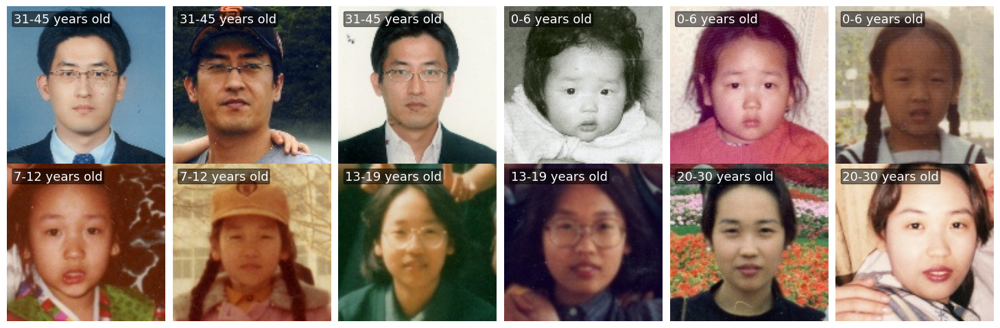

In [5]:
def show_images(images, labels, nrow=6, save_path=None):
    n_images = len(images)
    nrows = n_images // nrow + (n_images % nrow > 0)

    fig, axs = plt.subplots(nrows, nrow, figsize=(14.5, 2.3 * nrows), frameon=False)
    axs = axs.flatten() if n_images > 1 else [axs]

    for idx, (img, label) in enumerate(zip(images, labels)):
        ax = axs[idx]
        img_np = img.numpy().transpose((1, 2, 0))
        ax.imshow(img_np)
        ax.axis('off')

        ax.text(5, 5, label, color='white', fontsize=13,  ha='left', va='top',
                bbox=dict(facecolor='black', alpha=0.5, boxstyle='round,pad=0.1'))

    plt.tight_layout(pad=0)

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)

    plt.show()

iterator = iter(test_dataloader)
imgs, labels = next(iterator)

label_strs = [label_to_age[label.item()] for label in labels[7:19]]

show_images(imgs[7:19], label_strs, nrow=6)

#### <b>Train the "Original Model"</b>

* Train the Original model to serve as the base model for performing Machine Unlearning

In [6]:
learning_rate = 0.01
log_step = 30

model = models.resnet18(pretrained=False)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 8)
model = model.cuda()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

/home/egha/miniconda3/envs/unlearning/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/egha/miniconda3/envs/unlearning/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [7]:
def train():
    start_time = time.time()
    print(f'[Epoch: {epoch + 1} - Training]')
    model.train()
    total = 0
    running_loss = 0.0
    running_corrects = 0

    for i, batch in enumerate(train_dataloader):
        imgs, labels = batch
        imgs, labels = imgs.cuda(), labels.cuda()

        outputs = model(imgs)
        optimizer.zero_grad()
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        total += labels.shape[0]
        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data)

        if i % log_step == log_step - 1:
            print(f'[Batch: {i + 1}] running train loss: {running_loss / total}, running train accuracy: {running_corrects / total}')

    print(f'train loss: {running_loss / total}, accuracy: {running_corrects / total}')
    print("elapsed time:", time.time() - start_time)
    return running_loss / total, (running_corrects / total).item()


def test():
    start_time = time.time()
    print(f'[Test]')
    model.eval()
    total = 0
    running_loss = 0.0
    running_corrects = 0

    for i, batch in enumerate(test_dataloader):
        imgs, labels = batch
        imgs, labels = imgs.cuda(), labels.cuda()

        with torch.no_grad():
            outputs = model(imgs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

        total += labels.shape[0]
        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data)

        if (i == 0) or (i % log_step == log_step - 1):
            print(f'[Batch: {i + 1}] running test loss: {running_loss / total}, running test accuracy: {running_corrects / total}')

    print(f'test loss: {running_loss / total}, accuracy: {running_corrects / total}')
    print("elapsed time:", time.time() - start_time)
    return running_loss / total, (running_corrects / total).item()

In [8]:
def adjust_learning_rate(optimizer, epoch):
    lr = learning_rate
    if epoch >= 10:
        lr /= 10
    if epoch >= 20:
        lr /= 10
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

num_original_epochs = 30
best_test_acc = 0
best_epoch = 0

In [9]:
history = []
accuracy = []
for epoch in range(num_original_epochs):
    adjust_learning_rate(optimizer, epoch)
    train_loss, train_acc = train()
    test_loss, test_acc = test()
    history.append((train_loss, test_loss))
    accuracy.append((train_acc, test_acc))

    if test_acc > best_test_acc:
        print("[Info] best test accuracy!")
        best_test_acc = test_acc
        best_epoch = epoch
        torch.save(model.state_dict(), f'best_checkpoint_epoch_{epoch + 1}.pth')

torch.save(model.state_dict(), f'last_checkpoint_epoch_{num_original_epochs}.pth')

[Epoch: 1 - Training]
[Batch: 30] running train loss: 0.03222668170928955, running train accuracy: 0.18177084624767303
[Batch: 60] running train loss: 0.032638368538270394, running train accuracy: 0.18984375894069672
[Batch: 90] running train loss: 0.03171583561019765, running train accuracy: 0.21493056416511536
[Batch: 120] running train loss: 0.03104270019878944, running train accuracy: 0.23268230259418488
[Batch: 150] running train loss: 0.030655339645842713, running train accuracy: 0.2461458444595337
train loss: 0.03059829692888141, accuracy: 0.24907730519771576
elapsed time: 20.750232696533203
[Test]
[Batch: 1] running test loss: 0.035658981651067734, running test accuracy: 0.265625
test loss: 0.03167512557814848, accuracy: 0.28525015711784363
elapsed time: 1.0207183361053467
[Info] best test accuracy!
[Epoch: 2 - Training]
[Batch: 30] running train loss: 0.027005611297984917, running train accuracy: 0.3317708373069763
[Batch: 60] running train loss: 0.026536904430637758, running 

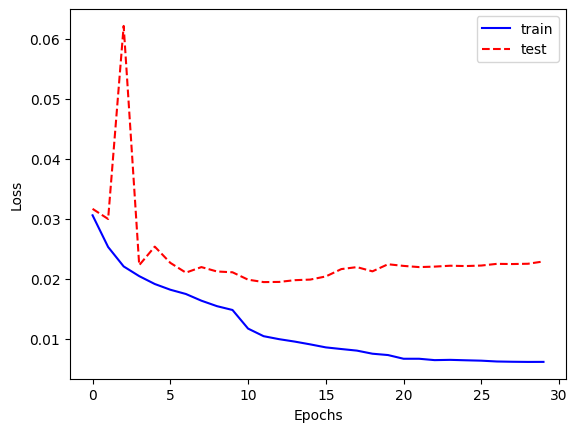

In [10]:
plt.plot([x[0] for x in history], 'b', label='train')
plt.plot([x[1] for x in history], 'r--',label='test')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

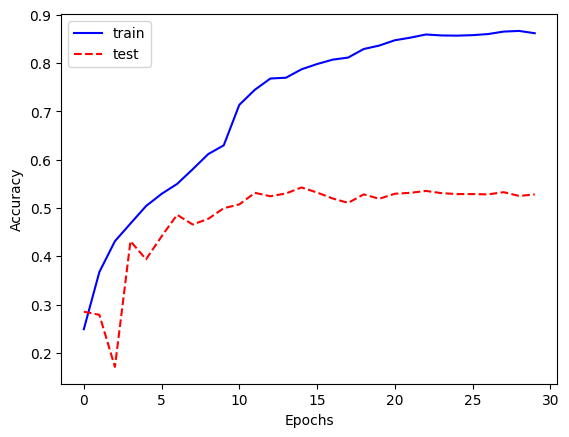

In [11]:
plt.plot([x[0] for x in accuracy], 'b', label='train')
plt.plot([x[1] for x in accuracy], 'r--',label='test')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

#### <b>(Option) Load the Pre-trained Original Model</b>

* We can easily download the pre-trained original model, rather than training the original model from scratch.
* <b>Download Link</b>: https://postechackr-my.sharepoint.com/:u:/g/personal/dongbinna_postech_ac_kr/EfNlaO0X8_1Ij4WPPLs09cgBQl3WB_y7zNTNwvRvIn2CDg

In [13]:
!wget https://postechackr-my.sharepoint.com/:u:/g/personal/dongbinna_postech_ac_kr/EfNlaO0X8_1Ij4WPPLs09cgBQl3WB_y7zNTNwvRvIn2CDg?download=1 -O pre_trained_last_checkpoint_epoch_30.pth

--2023-11-08 01:46:19--  https://postechackr-my.sharepoint.com/:u:/g/personal/dongbinna_postech_ac_kr/EfNlaO0X8_1Ij4WPPLs09cgBQl3WB_y7zNTNwvRvIn2CDg?download=1
Resolving postechackr-my.sharepoint.com (postechackr-my.sharepoint.com)... 13.107.136.10, 13.107.138.10, 2620:1ec:8fa::10, ...
Connecting to postechackr-my.sharepoint.com (postechackr-my.sharepoint.com)|13.107.136.10|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /personal/dongbinna_postech_ac_kr/Documents/Research/models/Machine%20Unlearning/last_checkpoint_epoch_30.pth?ga=1 [following]
--2023-11-08 01:46:20--  https://postechackr-my.sharepoint.com/personal/dongbinna_postech_ac_kr/Documents/Research/models/Machine%20Unlearning/last_checkpoint_epoch_30.pth?ga=1
Reusing existing connection to postechackr-my.sharepoint.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 44803358 (43M) [application/octet-stream]
Saving to: ‘pre_trained_last_checkpoint_epoch_30.pth’

pre_trained_last_ch 10

<b>Final Test</b>

In [14]:
model = models.resnet18(pretrained=False)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 8)
model = model.cuda()
# model_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
model_path = f'pre_trained_last_checkpoint_epoch_30.pth'
model.load_state_dict(torch.load(model_path))

test_loss, test_acc = test()
print("test loss:", test_loss)
print("test acc:", test_acc)

[Test]
[Batch: 1] running test loss: 0.023255331441760063, running test accuracy: 0.65625
test loss: 0.02677902813620812, accuracy: 0.5951917171478271
elapsed time: 1.0711042881011963
test loss: 0.02677902813620812
test acc: 0.5951917171478271


#### <b> Train the "Retrained Model"</b>
* A model trained on only the retain dataset from scratch, excluding the forget dataset.
* This model can serve as a proxy ground-truth for calculating the potential ground-truth (1) model utility and (2) forgetting score.

#### <b>Load Datasets 2</b>

* In the NeurIPS Competition setting, when performing machine unlearning, training is done with 'retain' and 'forget', so augmentation can be applied. However, it should never be applied during evaluation.
* We divide training dataset $\mathcal{D}_{train}$ into a retain dataset $\mathcal{D}_{retain}$ and a forget dataset $\mathcal{D}_{forget}$.

In [15]:
forget_dataset_train = Dataset(train_meta_data, train_image_directory, train_transform, forget=True)
forget_dataloader_train = DataLoader(forget_dataset_train, batch_size=64, shuffle=True)

retain_dataset_train = Dataset(train_meta_data, train_image_directory, train_transform, retain=True)
retain_dataloader_train = DataLoader(retain_dataset_train, batch_size=64, shuffle=True)

forget_dataset_test = Dataset(train_meta_data, train_image_directory, test_transform, forget=True)
forget_dataloader_test = DataLoader(forget_dataset_test, batch_size=64, shuffle=False)

retain_dataset_test = Dataset(train_meta_data, train_image_directory, test_transform, retain=True)
retain_dataloader_test = DataLoader(retain_dataset_test, batch_size=64, shuffle=False)

In [16]:
print('Train dataset size:', len(train_dataset))
print('Test dataset size:', len(test_dataset))
print('Forget dataset size:', len(forget_dataset_train))
print('Retain dataset size:', len(retain_dataset_train))
print('Unseen dataset size:', len(unseen_dataset))

Train dataset size: 10025
Test dataset size: 1539
Forget dataset size: 1500
Retain dataset size: 8525
Unseen dataset size: 1504


In [17]:
# Checking for duplicates across datasets
train_image_paths = [x[0] for x in train_dataset.image_age_list]
test_image_paths = [x[0] for x in test_dataset.image_age_list]
forget_image_paths = [x[0] for x in forget_dataset_train.image_age_list]
retain_image_paths = [x[0] for x in retain_dataset_train.image_age_list]
unseen_image_paths = [x[0] for x in unseen_dataset.image_age_list]

train_test_overlap = len(set(train_image_paths) & set(test_image_paths))
train_forget_overlap = len(set(train_image_paths) & set(forget_image_paths))
train_retain_overlap = len(set(train_image_paths) & set(retain_image_paths))
train_unseen_overlap = len(set(train_image_paths) & set(unseen_image_paths))
test_forget_overlap = len(set(test_image_paths) & set(forget_image_paths))
test_retain_overlap = len(set(test_image_paths) & set(retain_image_paths))
test_unseen_overlap = len(set(test_image_paths) & set(unseen_image_paths))
forget_retain_overlap = len(set(forget_image_paths) & set(retain_image_paths))
forget_unseen_overlap = len(set(forget_image_paths) & set(unseen_image_paths))
retain_unseen_overlap = len(set(retain_image_paths) & set(unseen_image_paths))

overlap_dict = {
    'train_test': train_test_overlap,
    'train_forget': train_forget_overlap,
    'train_retain': train_retain_overlap,
    'train_unseen': train_unseen_overlap,
    'test_forget': test_forget_overlap,
    'test_retain': test_retain_overlap,
    'test_unseen': test_unseen_overlap,
    'forget_retain': forget_retain_overlap,
    'forget_unseen': forget_unseen_overlap,
    'retain_unseen': retain_unseen_overlap
}
overlap_dict

{'train_test': 0,
 'train_forget': 1500,
 'train_retain': 8525,
 'train_unseen': 0,
 'test_forget': 0,
 'test_retain': 0,
 'test_unseen': 0,
 'forget_retain': 0,
 'forget_unseen': 0,
 'retain_unseen': 0}

In [18]:
@torch.no_grad()
def evaluation(model, data_loader):
    start_time = time.time()
    print(f'[Test]')
    model.eval()
    total = 0
    running_loss = 0.0
    running_corrects = 0
    running_top2_corrects = 0

    for i, batch in enumerate(data_loader):
        imgs, labels = batch
        imgs, labels = imgs.cuda(), labels.cuda()

        with torch.no_grad():
            outputs = model(imgs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # Top-2 accuracy.
            _, top2_preds = outputs.topk(2, dim=1)  # Get the top 2 class indices.
            top2_correct = top2_preds.eq(labels.view(-1, 1).expand_as(top2_preds))
            running_top2_corrects += top2_correct.any(dim=1).sum().item()

        total += labels.shape[0]
        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data).item()

        if (i == 0) or (i % log_step == log_step - 1):
            print(f'[Batch: {i + 1}] running test loss: {running_loss / total}, running test accuracy: {running_corrects / total}, running top-2 accuracy: {running_top2_corrects / total}')

    print(f'test loss: {running_loss / total}, accuracy: {running_corrects / total}, top-2 accuracy: {running_top2_corrects / total}')
    print("elapsed time:", time.time() - start_time)
    return {'Loss': running_loss / total, 'Acc': running_corrects / total, 'Top-2 Acc': running_top2_corrects / total}

def set_seed(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    random.seed(seed)

In [19]:
def compute_losses(net, loader):
    criterion = nn.CrossEntropyLoss(reduction="none")
    all_losses = []

    for inputs, y in loader:
        targets = y
        inputs, targets = inputs.cuda(), targets.cuda()

        logits = net(inputs)

        losses = criterion(logits, targets).cpu().detach().numpy()
        for l in losses:
            all_losses.append(l)

    return np.array(all_losses)

def simple_mia(sample_loss, members, n_splits=10, random_state=0):
    unique_members = np.unique(members)
    if not np.all(unique_members == np.array([0, 1])):
        raise ValueError("members should only have 0 and 1s")

    attack_model = linear_model.LogisticRegression()
    cv = model_selection.StratifiedShuffleSplit(
        n_splits=n_splits, random_state=random_state
    )
    return model_selection.cross_val_score(
        attack_model, sample_loss, members, cv=cv, scoring="accuracy"
    )

def cal_mia(model):
    set_seed(42)

    forget_losses = compute_losses(model, forget_dataloader_test)
    unseen_losses = compute_losses(model, unseen_dataloader)

    np.random.shuffle(forget_losses)
    forget_losses = forget_losses[: len(unseen_losses)]

    samples_mia = np.concatenate((unseen_losses, forget_losses)).reshape((-1, 1))
    labels_mia = [0] * len(unseen_losses) + [1] * len(forget_losses)

    mia_scores = simple_mia(samples_mia, labels_mia)
    forgetting_score = abs(0.5 - mia_scores.mean())

    return {'MIA': mia_scores.mean(), 'Forgeting Score': forgetting_score}

In [20]:
def train_model_using_only_retrain(model):
    start_time = time.time()
    print(f'[Epoch: {epoch + 1} - Training]')
    model.train()
    total = 0
    running_loss = 0.0
    running_corrects = 0

    for i, batch in enumerate(retain_dataloader_train):
        imgs, labels = batch
        imgs, labels = imgs.cuda(), labels.cuda()

        outputs = model(imgs)
        optimizer.zero_grad()
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        total += labels.shape[0]
        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data)

        if i % log_step == log_step - 1:
            print(f'[Batch: {i + 1}] running train loss: {running_loss / total}, running train accuracy: {running_corrects / total}')

    print(f'train loss: {running_loss / total}, accuracy: {running_corrects / total}')
    print("elapsed time:", time.time() - start_time)
    return running_loss / total, (running_corrects / total).item()

def test_model(model):
    start_time = time.time()
    print(f'[Test]')
    model.eval()
    total = 0
    running_loss = 0.0
    running_corrects = 0

    for i, batch in enumerate(test_dataloader):
        imgs, labels = batch
        imgs, labels = imgs.cuda(), labels.cuda()

        with torch.no_grad():
            outputs = model(imgs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

        total += labels.shape[0]
        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data)

        if (i == 0) or (i % log_step == log_step - 1):
            print(f'[Batch: {i + 1}] running test loss: {running_loss / total}, running test accuracy: {running_corrects / total}')

    print(f'test loss: {running_loss / total}, accuracy: {running_corrects / total}')
    print("elapsed time:", time.time() - start_time)
    return running_loss / total, (running_corrects / total).item()

def adjust_learning_rate(optimizer, epoch):
    lr = learning_rate
    if epoch >= 10:
        lr /= 10
    if epoch >= 20:
        lr /= 10
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

In [21]:
set_seed(42)

num_epochs = 30
best_test_acc = 0
best_epoch = 0
learning_rate = 0.01

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model = retrained_model.cuda()
criterion = nn.CrossEntropyLoss()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(retrained_model.parameters(), lr=learning_rate, momentum=0.9)

history = []
accuracy = []
for epoch in range(num_epochs):
    adjust_learning_rate(optimizer, epoch)
    train_loss, train_acc = train_model_using_only_retrain(retrained_model)
    test_loss, test_acc = test_model(retrained_model)
    history.append((train_loss, test_loss))
    accuracy.append((train_acc, test_acc))

    if test_acc > best_test_acc:
        print("[Info] best test accuracy!")
        best_test_acc = test_acc
        best_epoch = epoch

[Epoch: 1 - Training]
[Batch: 30] running train loss: 0.03220165371894836, running train accuracy: 0.1979166716337204
[Batch: 60] running train loss: 0.03154596903671821, running train accuracy: 0.22109375894069672
[Batch: 90] running train loss: 0.03097005956288841, running train accuracy: 0.24357639253139496
[Batch: 120] running train loss: 0.030510836793109775, running train accuracy: 0.2565104365348816
train loss: 0.030338642897843614, accuracy: 0.26146626472473145
elapsed time: 19.267264127731323
[Test]
[Batch: 1] running test loss: 0.02775653824210167, running test accuracy: 0.3125
test loss: 0.02981910533607587, accuracy: 0.3196881115436554
elapsed time: 1.035858392715454
[Info] best test accuracy!
[Epoch: 2 - Training]
[Batch: 30] running train loss: 0.02681671970834335, running train accuracy: 0.3453125059604645
[Batch: 60] running train loss: 0.026426316890865564, running train accuracy: 0.36015626788139343
[Batch: 90] running train loss: 0.025665119787057242, running train a

In [22]:
# Performance
test_acc = evaluation(retrained_model, test_dataloader)
unseen_acc = evaluation(retrained_model, unseen_dataloader)
mia = cal_mia(retrained_model.cuda())
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print()
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')

[Test]
[Batch: 1] running test loss: 0.02644580975174904, running test accuracy: 0.53125, running top-2 accuracy: 0.75
test loss: 0.023740008173242958, accuracy: 0.49057829759584143, top-2 accuracy: 0.7732293697205977
elapsed time: 1.0480015277862549
[Test]
[Batch: 1] running test loss: 0.020681440830230713, running test accuracy: 0.59375, running top-2 accuracy: 0.8125
test loss: 0.021633724701848437, accuracy: 0.5638297872340425, top-2 accuracy: 0.8091755319148937
elapsed time: 1.003016710281372
Test Acc: {'Loss': 0.023740008173242958, 'Acc': 0.49057829759584143, 'Top-2 Acc': 0.7732293697205977}
Unseen Acc: {'Loss': 0.021633724701848437, 'Acc': 0.5638297872340425, 'Top-2 Acc': 0.8091755319148937}
MIA: {'MIA': 0.5385382059800665, 'Forgeting Score': 0.03853820598006652}

Final Score: 0.7067509428178542


#### <b>Machine Unlearning Experiments</b>

* In the NeurIPS Competition setting, when performing machine unlearning, training is done with 'retain' and 'forget', so augmentation can be applied. However, it should never be applied during evaluation.

<b>Original Model Preformance</b>

In [23]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
original_model = models.resnet18(pretrained=False)
num_features = original_model.fc.in_features
original_model.fc = nn.Linear(num_features, 8)
original_model.load_state_dict(torch.load(original_save_path))
original_model = original_model.cuda()
criterion = nn.CrossEntropyLoss()

test_acc = evaluation(original_model, test_dataloader)
test_acc

set_seed(42)

# Performance
test_acc = evaluation(original_model, test_dataloader)
unseen_acc = evaluation(original_model, unseen_dataloader)
mia = cal_mia(original_model.cuda())
print()
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')

[Test]


/home/egha/miniconda3/envs/unlearning/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/egha/miniconda3/envs/unlearning/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


[Batch: 1] running test loss: 0.023255331441760063, running test accuracy: 0.65625, running top-2 accuracy: 0.9375
test loss: 0.02677902813620812, accuracy: 0.5951916829109811, top-2 accuracy: 0.8804418453541261
elapsed time: 1.0483644008636475
[Test]
[Batch: 1] running test loss: 0.023255331441760063, running test accuracy: 0.65625, running top-2 accuracy: 0.9375
test loss: 0.02677902813620812, accuracy: 0.5951916829109811, top-2 accuracy: 0.8804418453541261
elapsed time: 1.0457944869995117
[Test]
[Batch: 1] running test loss: 0.01937253773212433, running test accuracy: 0.640625, running top-2 accuracy: 0.9375
test loss: 0.021540875011619103, accuracy: 0.65625, top-2 accuracy: 0.8936170212765957
elapsed time: 1.0144059658050537

Test Acc: {'Loss': 0.02677902813620812, 'Acc': 0.5951916829109811, 'Top-2 Acc': 0.8804418453541261}
Unseen Acc: {'Loss': 0.021540875011619103, 'Acc': 0.65625, 'Top-2 Acc': 0.8936170212765957}
MIA: {'MIA': 0.7136212624584718, 'Forgeting Score': 0.21362126245847

#### <b>Fine-Tuning</b>
* A method where the original model undergoes further training solely on the retain dataset.
* This approach aims to reinforce the model's knowledge of the retain dataset, potentially leading to the forgetting of the previously learned forget dataset.

In [26]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
unlearned_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()

test_acc = evaluation(unlearned_model, test_dataloader)
test_acc

[Test]
[Batch: 1] running test loss: 0.023255331441760063, running test accuracy: 0.65625, running top-2 accuracy: 0.9375
test loss: 0.02677902813620812, accuracy: 0.5951916829109811, top-2 accuracy: 0.8804418453541261
elapsed time: 1.0641217231750488


{'Loss': 0.02677902813620812,
 'Acc': 0.5951916829109811,
 'Top-2 Acc': 0.8804418453541261}

In [27]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(unlearned_model.parameters(), lr=0.001)

num_epochs = 2
for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, (x_retain, y_retain) in enumerate(retain_dataloader_train):
        y_retain = y_retain.cuda()

        # Classification Loss
        outputs_retain = unlearned_model(x_retain.cuda())
        classification_loss = criterion(outputs_retain, y_retain)

        optimizer.zero_grad()
        classification_loss.backward()
        optimizer.step()

        running_loss += classification_loss.item() * x_retain.size(0)
        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {classification_loss.item():.4f}")

    average_epoch_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    print(f"Epoch [{epoch+1}/{num_epochs}] - Total Loss: {running_loss:.4f}")

Epoch [1/2], Batch [1/134] - Batch Loss: 0.0684
Epoch [1/2], Batch [2/134] - Batch Loss: 0.0694
Epoch [1/2], Batch [3/134] - Batch Loss: 0.1521
Epoch [1/2], Batch [4/134] - Batch Loss: 0.0999
Epoch [1/2], Batch [5/134] - Batch Loss: 0.1253
Epoch [1/2], Batch [6/134] - Batch Loss: 0.0666
Epoch [1/2], Batch [7/134] - Batch Loss: 0.1253
Epoch [1/2], Batch [8/134] - Batch Loss: 0.1272
Epoch [1/2], Batch [9/134] - Batch Loss: 0.1677
Epoch [1/2], Batch [10/134] - Batch Loss: 0.0695
Epoch [1/2], Batch [11/134] - Batch Loss: 0.0952
Epoch [1/2], Batch [12/134] - Batch Loss: 0.1777
Epoch [1/2], Batch [13/134] - Batch Loss: 0.0589
Epoch [1/2], Batch [14/134] - Batch Loss: 0.1540
Epoch [1/2], Batch [15/134] - Batch Loss: 0.0835
Epoch [1/2], Batch [16/134] - Batch Loss: 0.1534
Epoch [1/2], Batch [17/134] - Batch Loss: 0.1022
Epoch [1/2], Batch [18/134] - Batch Loss: 0.0360
Epoch [1/2], Batch [19/134] - Batch Loss: 0.0992
Epoch [1/2], Batch [20/134] - Batch Loss: 0.0553
Epoch [1/2], Batch [21/134] -

In [28]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())
print()
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')

[Test]
[Batch: 1] running test loss: 0.023728128522634506, running test accuracy: 0.671875, running top-2 accuracy: 0.9375
test loss: 0.028049036850783637, accuracy: 0.6055880441845354, top-2 accuracy: 0.8882391163092918
elapsed time: 1.040757179260254
[Test]
[Batch: 1] running test loss: 0.019499219954013824, running test accuracy: 0.703125, running top-2 accuracy: 0.953125
test loss: 0.022524779345443908, accuracy: 0.6529255319148937, top-2 accuracy: 0.8922872340425532
elapsed time: 0.9887948036193848

Test Acc: {'Loss': 0.028049036850783637, 'Acc': 0.6055880441845354, 'Top-2 Acc': 0.8882391163092918}
Unseen Acc: {'Loss': 0.022524779345443908, 'Acc': 0.6529255319148937, 'Top-2 Acc': 0.8922872340425532}
MIA: {'MIA': 0.7126245847176079, 'Forgeting Score': 0.21262458471760792}
Final Score: 0.5901694373746598


#### <b>CF-k (Class-wise Forgetting)</b>
* A strategy that fine-tunes specific layers to make the model forget target data while retaining class structures.

In [29]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
cf_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()

In [30]:
# Print a weight set of a front layer in the network to check the freezing.
print(unlearned_model.layer1[0].conv1.weight[0][0])

tensor([[ 0.0823, -0.0807, -0.0291],
        [-0.0787, -0.8153, -0.2380],
        [ 0.0615, -0.1015, -0.0267]], device='cuda:0',
       grad_fn=<SelectBackward0>)


In [31]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, unlearned_model.parameters()), lr=0.001)

# Freeze all the parameters.
for param in unlearned_model.parameters():
    param.requires_grad = False

# Only unfreeze the last three layers for the fine-tuning.
for param in unlearned_model.layer3.parameters():
    param.requires_grad = True
for param in unlearned_model.layer4.parameters():
    param.requires_grad = True
for param in unlearned_model.avgpool.parameters():
    param.requires_grad = True
for param in unlearned_model.fc.parameters():
    param.requires_grad = True

num_epochs = 2

for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, (x_retain, y_retain) in enumerate(retain_dataloader_train):
        y_retain = y_retain.cuda()

        # Classification Loss
        outputs_retain = unlearned_model(x_retain.cuda())
        classification_loss = criterion(outputs_retain, y_retain)

        optimizer.zero_grad()
        classification_loss.backward()
        optimizer.step()

        running_loss += classification_loss.item() * x_retain.size(0)
        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {classification_loss.item():.4f}")

    average_epoch_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    print(f"Epoch [{epoch+1}/{num_epochs}] - Total Loss: {running_loss:.4f}")

Epoch [1/2], Batch [1/134] - Batch Loss: 0.0954
Epoch [1/2], Batch [2/134] - Batch Loss: 0.1448
Epoch [1/2], Batch [3/134] - Batch Loss: 0.1909
Epoch [1/2], Batch [4/134] - Batch Loss: 0.1117
Epoch [1/2], Batch [5/134] - Batch Loss: 0.0977
Epoch [1/2], Batch [6/134] - Batch Loss: 0.0906
Epoch [1/2], Batch [7/134] - Batch Loss: 0.1673
Epoch [1/2], Batch [8/134] - Batch Loss: 0.1456
Epoch [1/2], Batch [9/134] - Batch Loss: 0.1952
Epoch [1/2], Batch [10/134] - Batch Loss: 0.0871
Epoch [1/2], Batch [11/134] - Batch Loss: 0.1243
Epoch [1/2], Batch [12/134] - Batch Loss: 0.1583
Epoch [1/2], Batch [13/134] - Batch Loss: 0.1031
Epoch [1/2], Batch [14/134] - Batch Loss: 0.2185
Epoch [1/2], Batch [15/134] - Batch Loss: 0.0997
Epoch [1/2], Batch [16/134] - Batch Loss: 0.1709
Epoch [1/2], Batch [17/134] - Batch Loss: 0.1442
Epoch [1/2], Batch [18/134] - Batch Loss: 0.0441
Epoch [1/2], Batch [19/134] - Batch Loss: 0.0921
Epoch [1/2], Batch [20/134] - Batch Loss: 0.0567
Epoch [1/2], Batch [21/134] -

In [32]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')

[Test]
[Batch: 1] running test loss: 0.024214962497353554, running test accuracy: 0.625, running top-2 accuracy: 0.921875
test loss: 0.0276154750659142, accuracy: 0.589993502274204, top-2 accuracy: 0.8804418453541261
elapsed time: 1.027921438217163
[Test]
[Batch: 1] running test loss: 0.01942582055926323, running test accuracy: 0.65625, running top-2 accuracy: 0.9375
test loss: 0.02191088970829832, accuracy: 0.6575797872340425, top-2 accuracy: 0.8916223404255319
elapsed time: 1.0060012340545654
Test Acc: {'Loss': 0.0276154750659142, 'Acc': 0.589993502274204, 'Top-2 Acc': 0.8804418453541261}
Unseen Acc: {'Loss': 0.02191088970829832, 'Acc': 0.6575797872340425, 'Top-2 Acc': 0.8916223404255319}
MIA: {'MIA': 0.7126245847176079, 'Forgeting Score': 0.21262458471760792}
Final Score: 0.5823721664194941


In [33]:
# Print a weight set of a front layer in the network to check the freezing.
print(unlearned_model.layer1[0].conv1.weight[0][0])

tensor([[ 0.0823, -0.0807, -0.0291],
        [-0.0787, -0.8153, -0.2380],
        [ 0.0615, -0.1015, -0.0267]], device='cuda:0')


#### <b>Negative Gradient Ascent</b>
* A strategy that induces the model to 'forget' particular data by deliberately maximizing the error on the forget dataset.

<b>Normal NegGrad</b>

In [34]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
unlearned_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()

In [35]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(unlearned_model.parameters(), lr=0.001)

dataloader_iterator = iter(forget_dataloader_train)

num_epochs = 2
for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, (x_retain, y_retain) in enumerate(retain_dataloader_train):
        y_retain = y_retain.cuda()

        try:
            (x_forget, y_forget) = next(dataloader_iterator)
        except StopIteration:
            dataloader_iterator = iter(forget_dataloader_train)
            (x_forget, y_forget) = next(dataloader_iterator)

        if x_forget.size(0) != x_retain.size(0):
            continue

        outputs_forget = unlearned_model(x_forget.cuda())
        loss_ascent_forget = -criterion(outputs_forget, y_forget.cuda())

        optimizer.zero_grad()
        loss_ascent_forget.backward()
        optimizer.step()

        running_loss += loss_ascent_forget.item() * x_retain.size(0)
        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {loss_ascent_forget.item():.4f}")

    average_epoch_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    print(f"Epoch [{epoch+1}/{num_epochs}] - Total Loss: {running_loss:.4f}")

Epoch [1/2], Batch [1/134] - Batch Loss: -0.1445
Epoch [1/2], Batch [2/134] - Batch Loss: -0.1175
Epoch [1/2], Batch [3/134] - Batch Loss: -0.0994
Epoch [1/2], Batch [4/134] - Batch Loss: -0.2439
Epoch [1/2], Batch [5/134] - Batch Loss: -0.1847
Epoch [1/2], Batch [6/134] - Batch Loss: -0.0857
Epoch [1/2], Batch [7/134] - Batch Loss: -0.0473
Epoch [1/2], Batch [8/134] - Batch Loss: -0.0796
Epoch [1/2], Batch [9/134] - Batch Loss: -0.0431
Epoch [1/2], Batch [10/134] - Batch Loss: -0.0447
Epoch [1/2], Batch [11/134] - Batch Loss: -0.0971
Epoch [1/2], Batch [12/134] - Batch Loss: -0.1271
Epoch [1/2], Batch [13/134] - Batch Loss: -0.1928
Epoch [1/2], Batch [14/134] - Batch Loss: -0.0865
Epoch [1/2], Batch [15/134] - Batch Loss: -0.2027
Epoch [1/2], Batch [16/134] - Batch Loss: -0.0614
Epoch [1/2], Batch [17/134] - Batch Loss: -0.1751
Epoch [1/2], Batch [18/134] - Batch Loss: -0.2081
Epoch [1/2], Batch [19/134] - Batch Loss: -0.0550
Epoch [1/2], Batch [20/134] - Batch Loss: -0.0638
Epoch [1/

In [36]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')

[Test]
[Batch: 1] running test loss: 0.15932099521160126, running test accuracy: 0.515625, running top-2 accuracy: 0.640625
test loss: 0.21915349222918157, accuracy: 0.4048083170890188, top-2 accuracy: 0.5925925925925926
elapsed time: 1.028597354888916
[Test]
[Batch: 1] running test loss: 0.13622818887233734, running test accuracy: 0.453125, running top-2 accuracy: 0.734375
test loss: 0.18791931677371898, accuracy: 0.4408244680851064, top-2 accuracy: 0.6236702127659575
elapsed time: 0.9977476596832275
Test Acc: {'Loss': 0.21915349222918157, 'Acc': 0.4048083170890188, 'Top-2 Acc': 0.5925925925925926}
Unseen Acc: {'Loss': 0.18791931677371898, 'Acc': 0.4408244680851064, 'Top-2 Acc': 0.6236702127659575}
MIA: {'MIA': 0.5488372093023256, 'Forgeting Score': 0.0488372093023256}
Final Score: 0.6535669492421838


<b>Advanced NegGrad with Classification Loss</b>

In [37]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
unlearned_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()

In [38]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(unlearned_model.parameters(), lr=0.001)

dataloader_iterator = iter(forget_dataloader_train)

num_epochs = 2
for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, (x_retain, y_retain) in enumerate(retain_dataloader_train):
        y_retain = y_retain.cuda()

        try:
            (x_forget, y_forget) = next(dataloader_iterator)
        except StopIteration:
            dataloader_iterator = iter(forget_dataloader_train)
            (x_forget, y_forget) = next(dataloader_iterator)

        if x_forget.size(0) != x_retain.size(0):
            continue

        outputs_retain = unlearned_model(x_retain.cuda())
        outputs_forget = unlearned_model(x_forget.cuda())

        loss_ascent_forget = -criterion(outputs_forget, y_forget.cuda())
        loss_retain = criterion(outputs_retain, y_retain.cuda())

        # Overall loss
        joint_loss = loss_ascent_forget + loss_retain

        print("joint loss :", joint_loss.item())
        optimizer.zero_grad()
        joint_loss.backward()
        optimizer.step()

        running_loss += joint_loss.item() * x_retain.size(0)
        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {joint_loss.item():.4f}")

    average_epoch_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    print(f"Epoch [{epoch+1}/{num_epochs}] - Total Loss: {running_loss:.4f}")

-0.013366997241973877
Epoch [1/2], Batch [1/134] - Batch Loss: -0.0134
-0.013818107545375824
Epoch [1/2], Batch [2/134] - Batch Loss: -0.0138
-0.05418343469500542
Epoch [1/2], Batch [3/134] - Batch Loss: -0.0542
-0.14198480546474457
Epoch [1/2], Batch [4/134] - Batch Loss: -0.1420
-0.002699613571166992
Epoch [1/2], Batch [5/134] - Batch Loss: -0.0027
0.14540046453475952
Epoch [1/2], Batch [6/134] - Batch Loss: 0.1454
0.0793810486793518
Epoch [1/2], Batch [7/134] - Batch Loss: 0.0794
-0.03448234498500824
Epoch [1/2], Batch [8/134] - Batch Loss: -0.0345
0.07811513543128967
Epoch [1/2], Batch [9/134] - Batch Loss: 0.0781
0.07611384987831116
Epoch [1/2], Batch [10/134] - Batch Loss: 0.0761
0.015426702797412872
Epoch [1/2], Batch [11/134] - Batch Loss: 0.0154
0.017191052436828613
Epoch [1/2], Batch [12/134] - Batch Loss: 0.0172
-0.1195831149816513
Epoch [1/2], Batch [13/134] - Batch Loss: -0.1196
0.003986567258834839
Epoch [1/2], Batch [14/134] - Batch Loss: 0.0040
-0.09607618302106857
Epoc

In [39]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')

[Test]
[Batch: 1] running test loss: 0.030934354290366173, running test accuracy: 0.5625, running top-2 accuracy: 0.84375
test loss: 0.041914248172147776, accuracy: 0.5633528265107213, top-2 accuracy: 0.8557504873294347
elapsed time: 1.046513557434082
[Test]
[Batch: 1] running test loss: 0.031714364886283875, running test accuracy: 0.59375, running top-2 accuracy: 0.890625
test loss: 0.03266132793369445, accuracy: 0.620345744680851, top-2 accuracy: 0.8736702127659575
elapsed time: 1.0118212699890137
Test Acc: {'Loss': 0.041914248172147776, 'Acc': 0.5633528265107213, 'Top-2 Acc': 0.8557504873294347}
Unseen Acc: {'Loss': 0.03266132793369445, 'Acc': 0.620345744680851, 'Top-2 Acc': 0.8736702127659575}
MIA: {'MIA': 0.5953488372093023, 'Forgeting Score': 0.09534883720930232}
Final Score: 0.6863275760460583


#### <b>UNSIR</b>
* <b>Impair phase (Stage 1)</b>: Update noise to increase the distance between the model and the forget dataset. Then, the updated noise is then integrated into the training dataset to enhance the model's ability to forget the specific dataset.
* <b>Repair phase (Stage 2)</b>: Repair the impaired model using the retain dataset.

<b> Stage1: Impair</b>

In [40]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
unlearned_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()

test_acc = evaluation(unlearned_model, test_dataloader)
test_acc

[Test]
[Batch: 1] running test loss: 0.023255331441760063, running test accuracy: 0.65625, running top-2 accuracy: 0.9375
test loss: 0.02677902813620812, accuracy: 0.5951916829109811, top-2 accuracy: 0.8804418453541261
elapsed time: 1.049553632736206


{'Loss': 0.02677902813620812,
 'Acc': 0.5951916829109811,
 'Top-2 Acc': 0.8804418453541261}

In [41]:
class Noise(nn.Module):
    def __init__(self, batch_size, *dim):
        super().__init__()
        self.noise = nn.Parameter(torch.randn(batch_size, *dim), requires_grad=True)

    def forward(self):
        return self.noise

def float_to_uint8(img_float):
    """Convert a floating point image in the range [0,1] to uint8 image in the range [0,255]."""
    img_uint8 = (img_float * 255).astype(np.uint8)
    return img_uint8

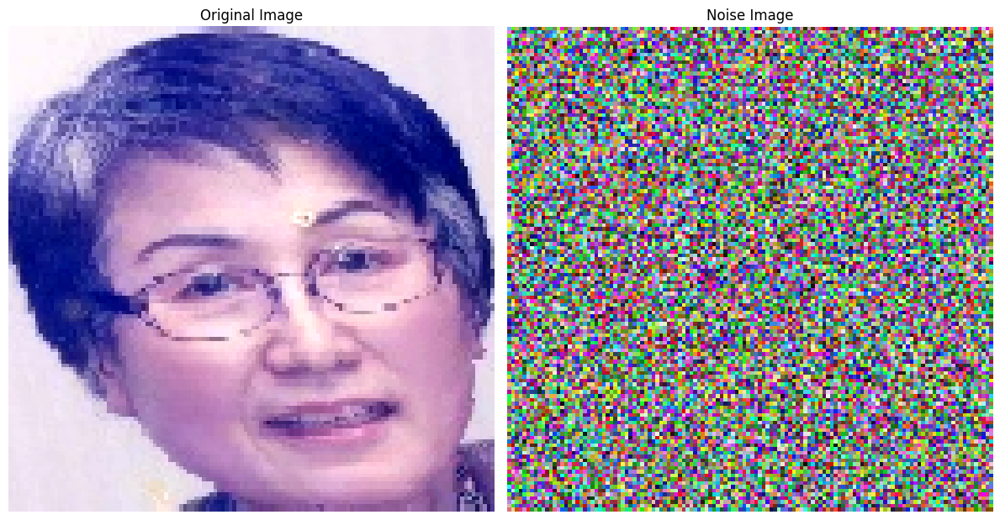

Epoch [1/2], Batch [1/134] - Batch Loss: 9.1080


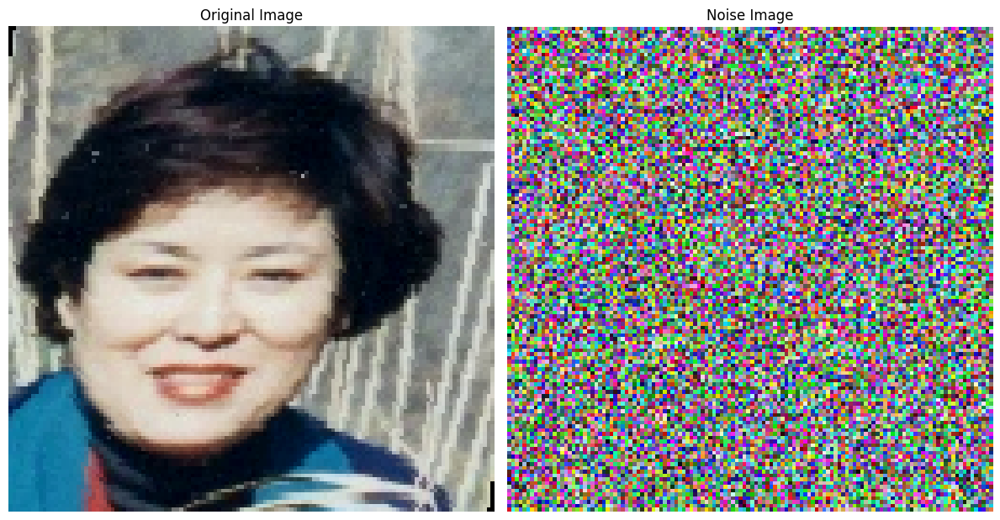

Epoch [1/2], Batch [2/134] - Batch Loss: 5.2971


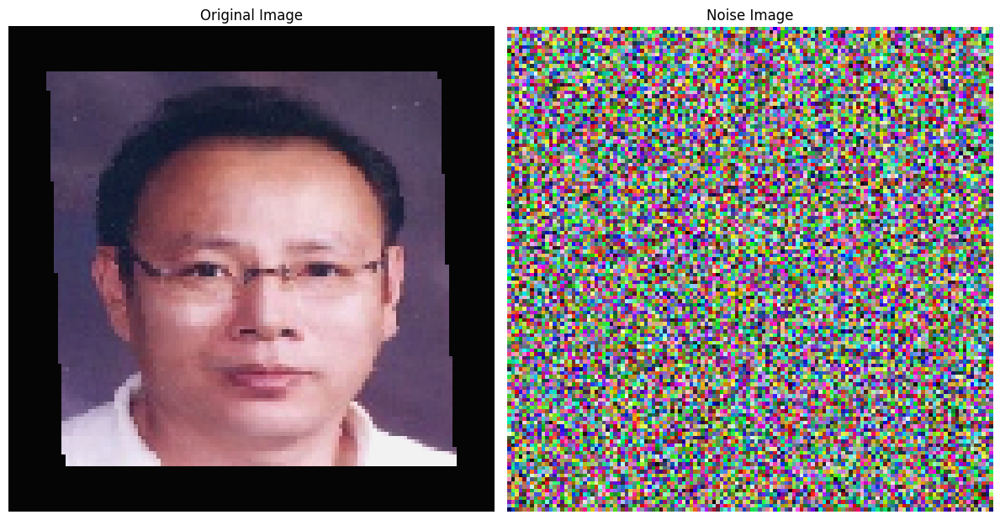

Epoch [1/2], Batch [3/134] - Batch Loss: 4.5181


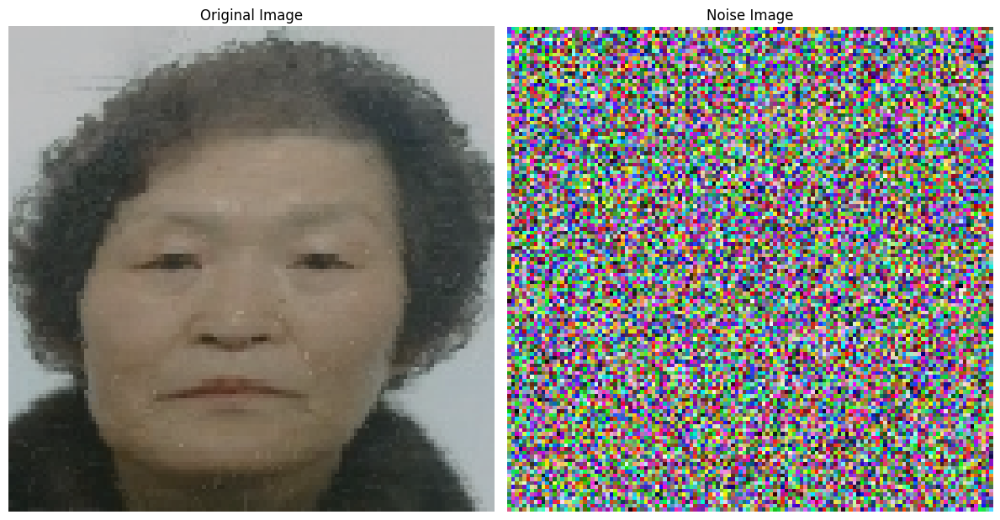

Epoch [1/2], Batch [4/134] - Batch Loss: 3.0745


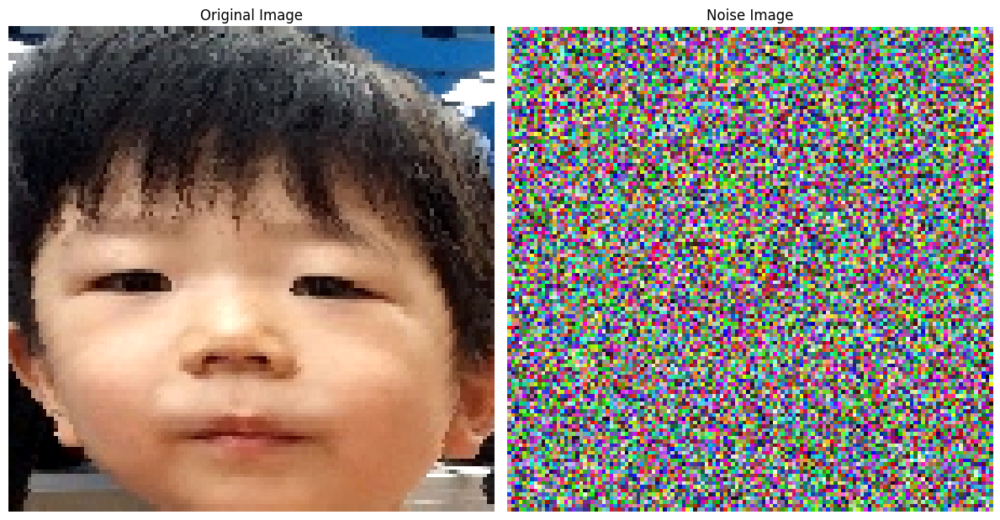

Epoch [1/2], Batch [5/134] - Batch Loss: 3.3810


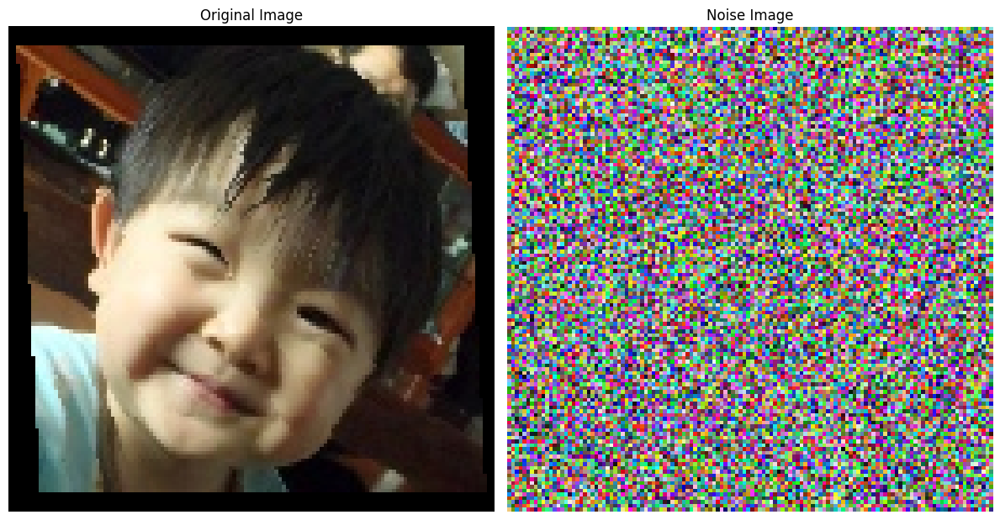

Epoch [1/2], Batch [6/134] - Batch Loss: 2.3438


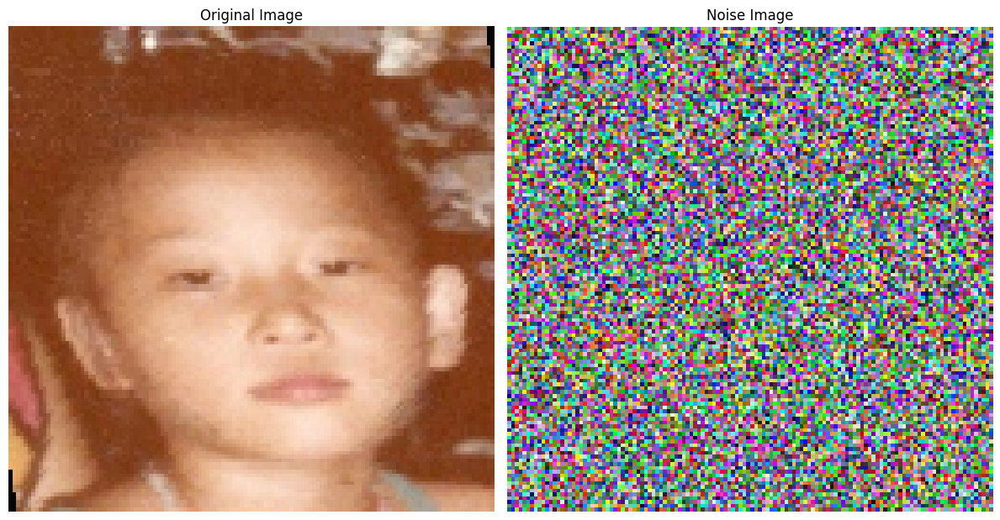

Epoch [1/2], Batch [7/134] - Batch Loss: 2.1724


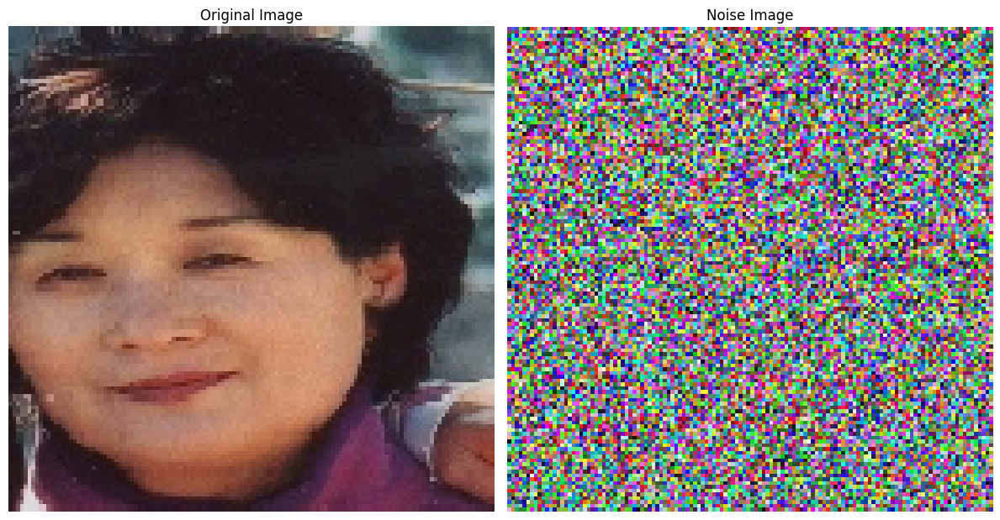

Epoch [1/2], Batch [8/134] - Batch Loss: 2.1031


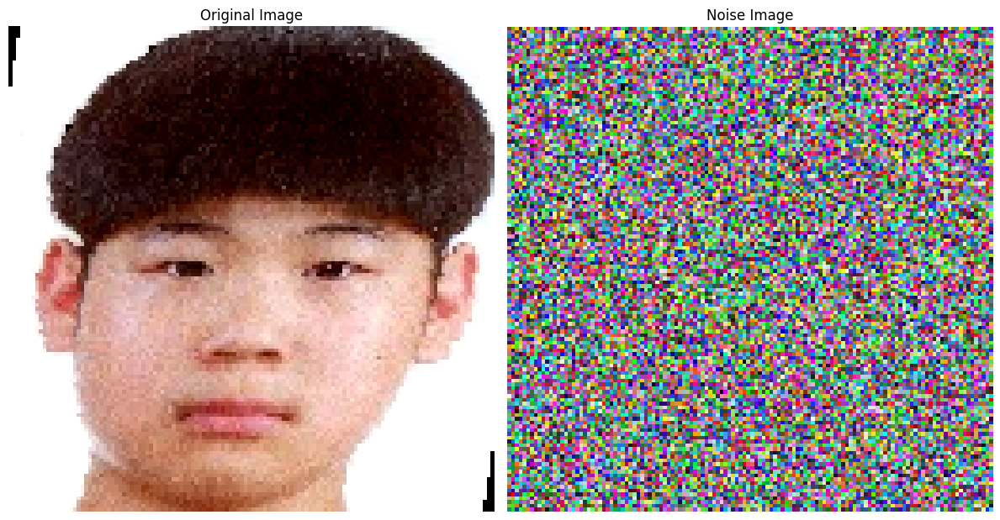

Epoch [1/2], Batch [9/134] - Batch Loss: 2.0093


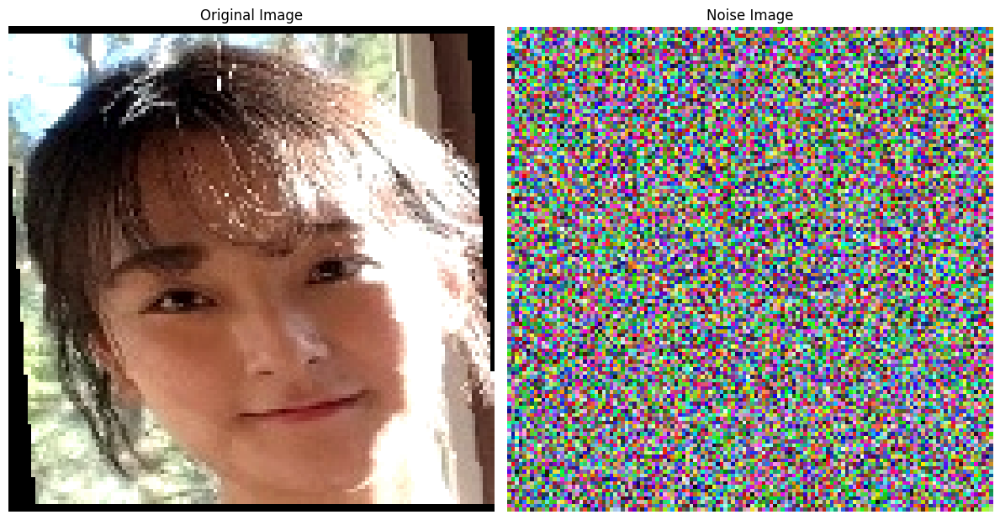

Epoch [1/2], Batch [10/134] - Batch Loss: 2.2134


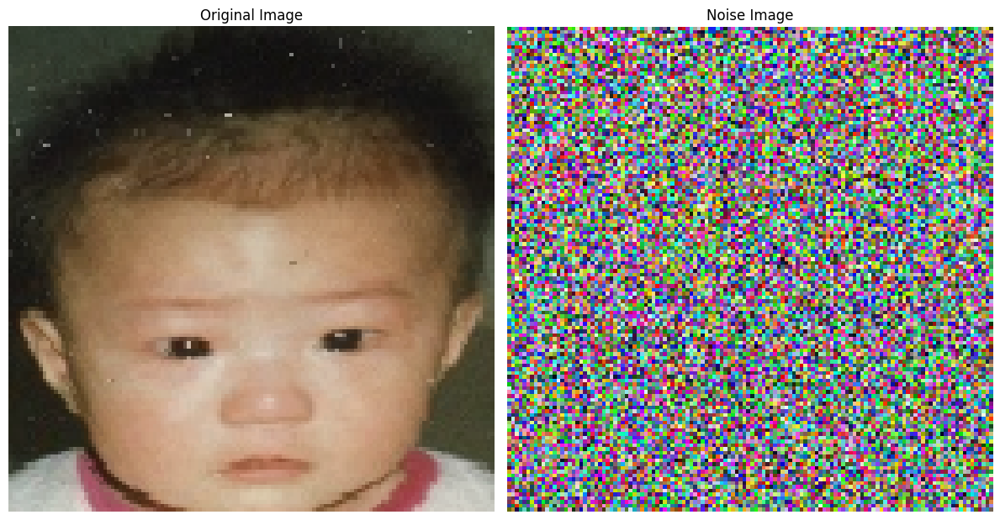

Epoch [1/2], Batch [11/134] - Batch Loss: 2.1311


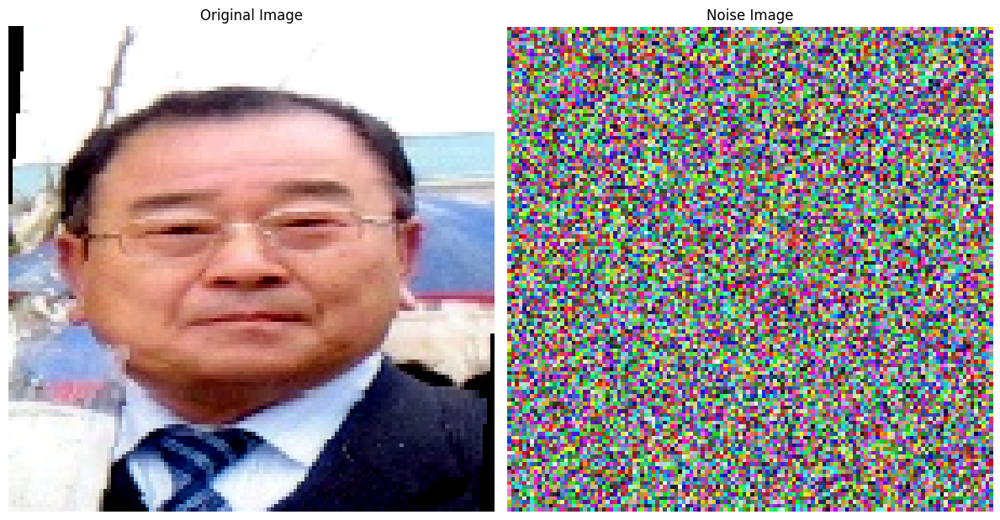

Epoch [1/2], Batch [12/134] - Batch Loss: 2.2346


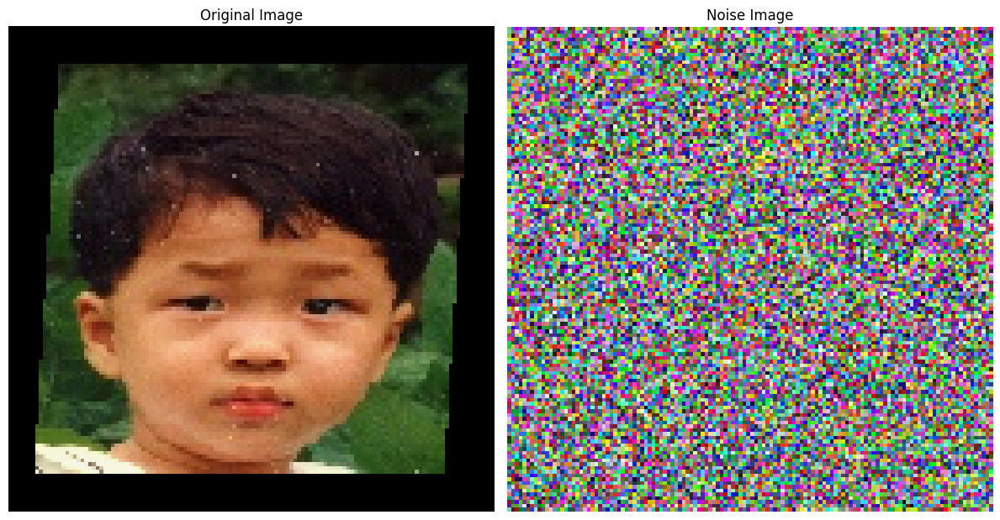

Epoch [1/2], Batch [13/134] - Batch Loss: 2.1521


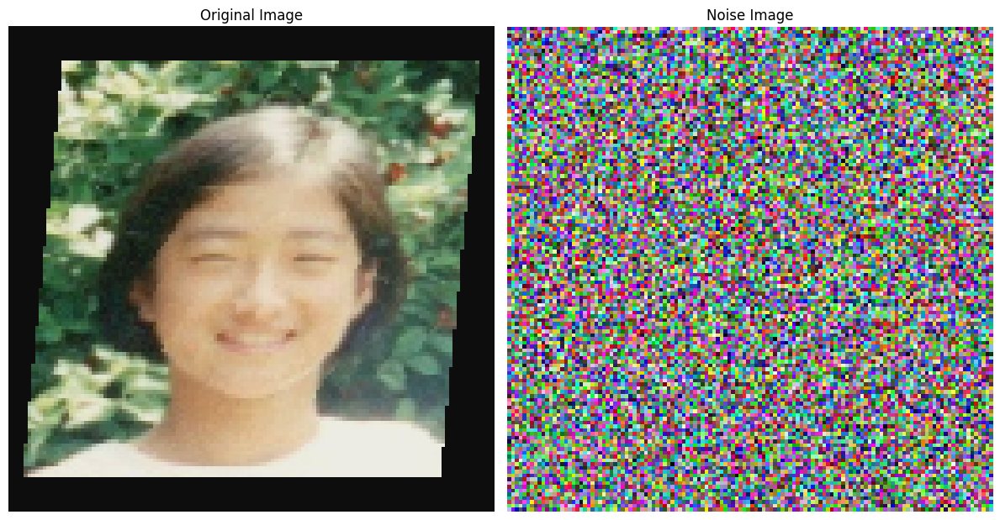

Epoch [1/2], Batch [14/134] - Batch Loss: 2.0590


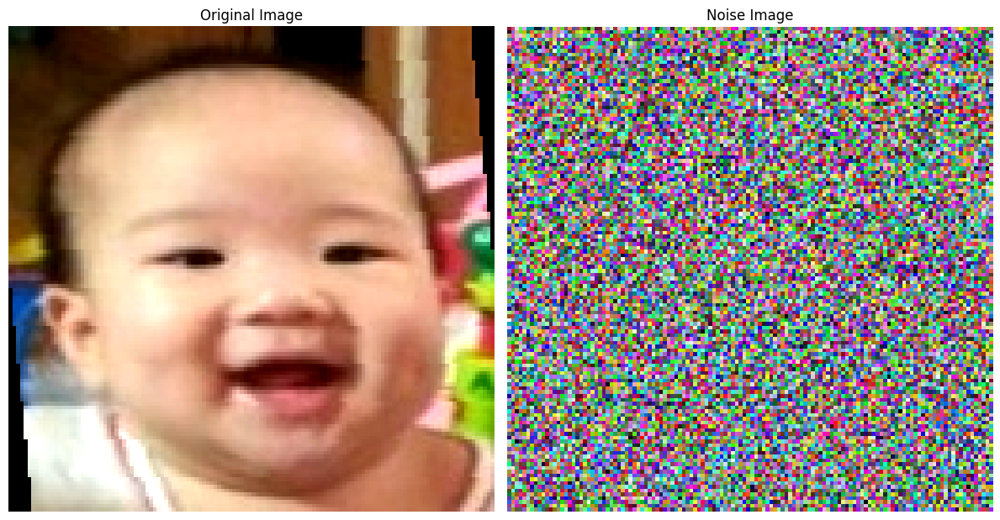

Epoch [1/2], Batch [15/134] - Batch Loss: 2.1565


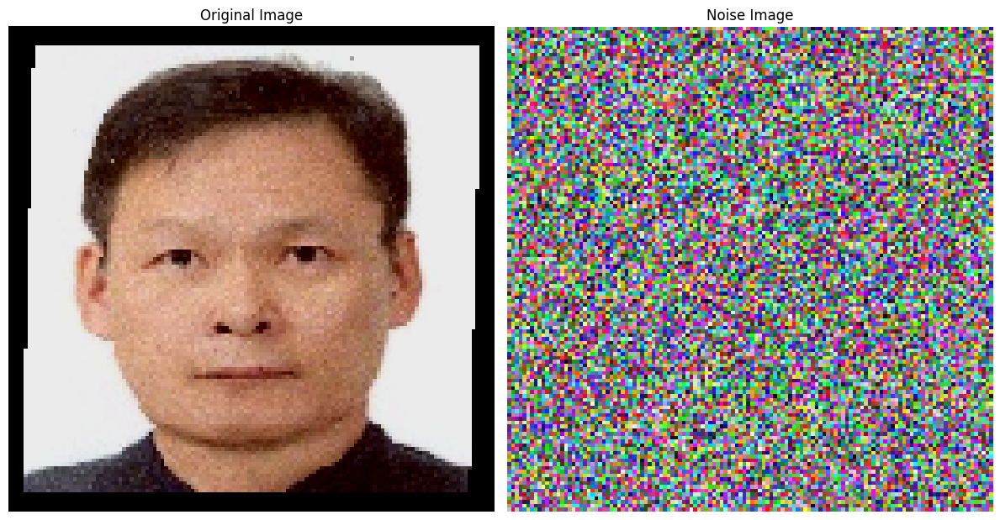

Epoch [1/2], Batch [16/134] - Batch Loss: 2.0210


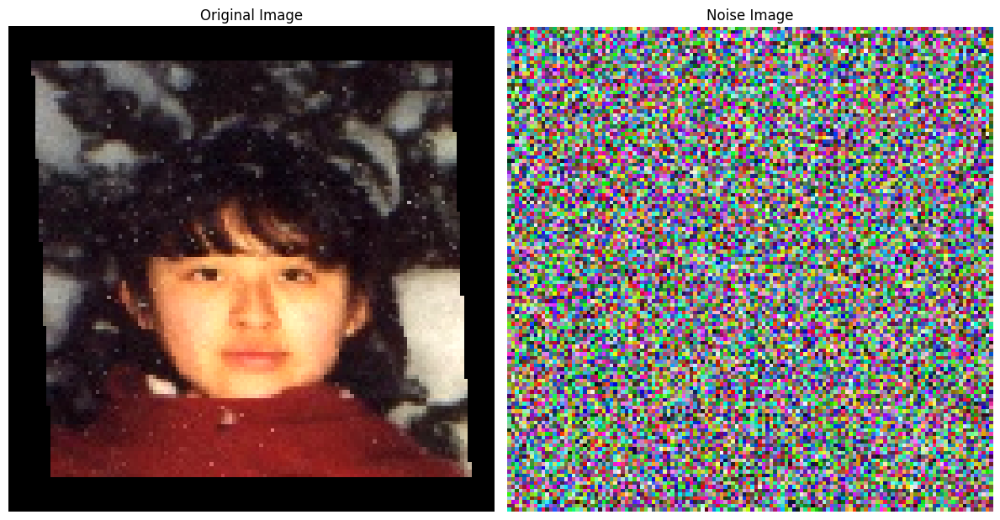

Epoch [1/2], Batch [17/134] - Batch Loss: 1.9993


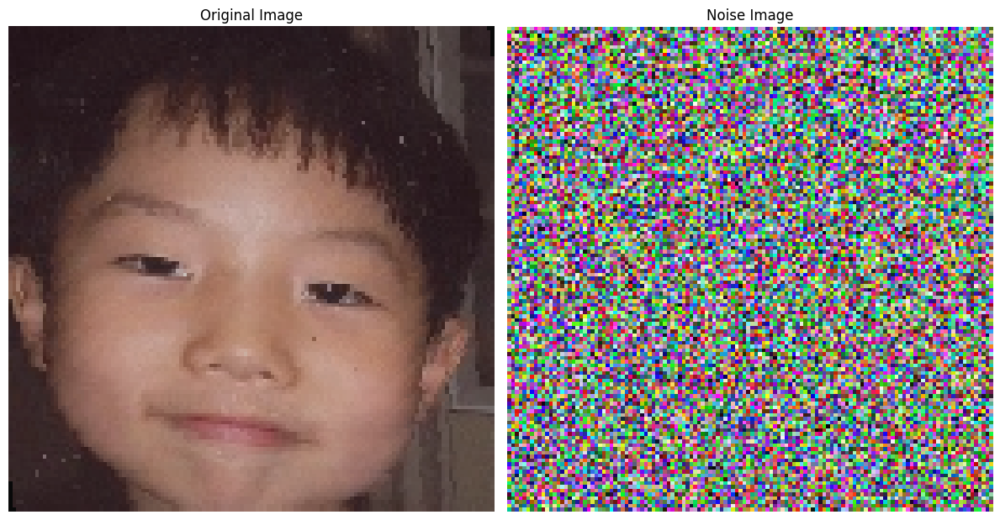

Epoch [1/2], Batch [18/134] - Batch Loss: 2.1354


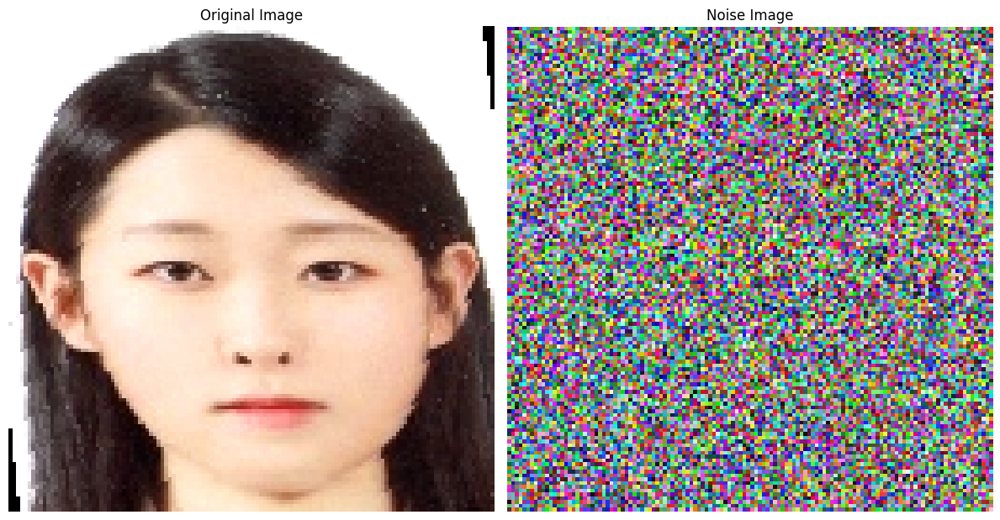

Epoch [1/2], Batch [19/134] - Batch Loss: 1.9883


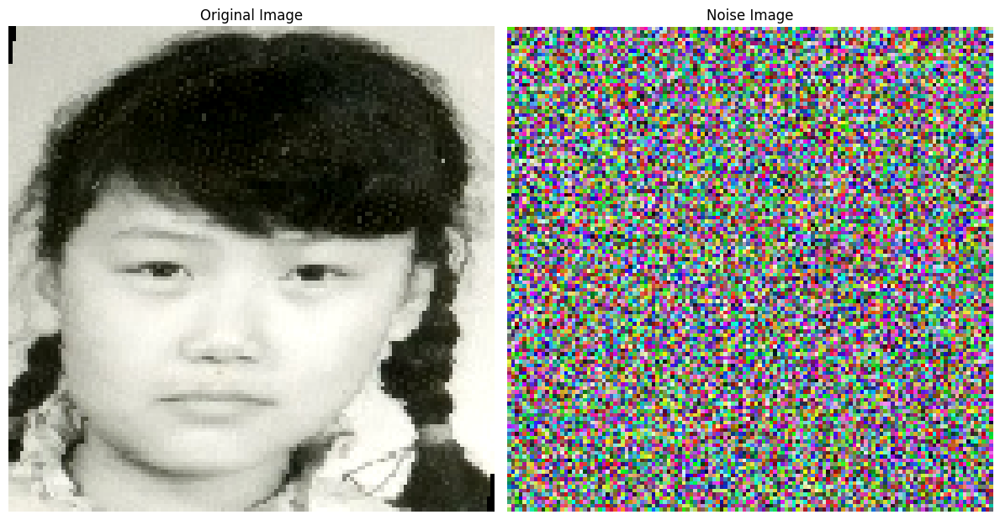

Epoch [1/2], Batch [20/134] - Batch Loss: 2.0632


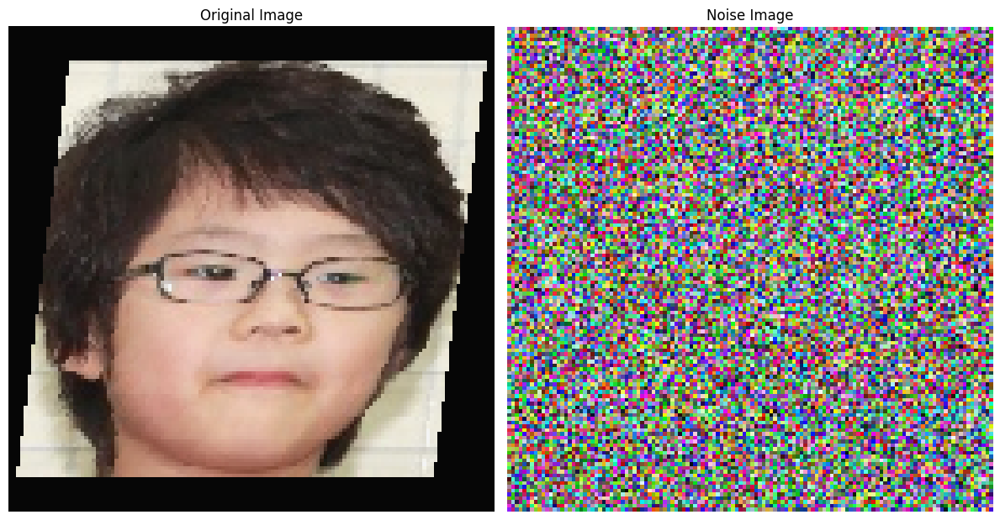

Epoch [1/2], Batch [21/134] - Batch Loss: 2.0645


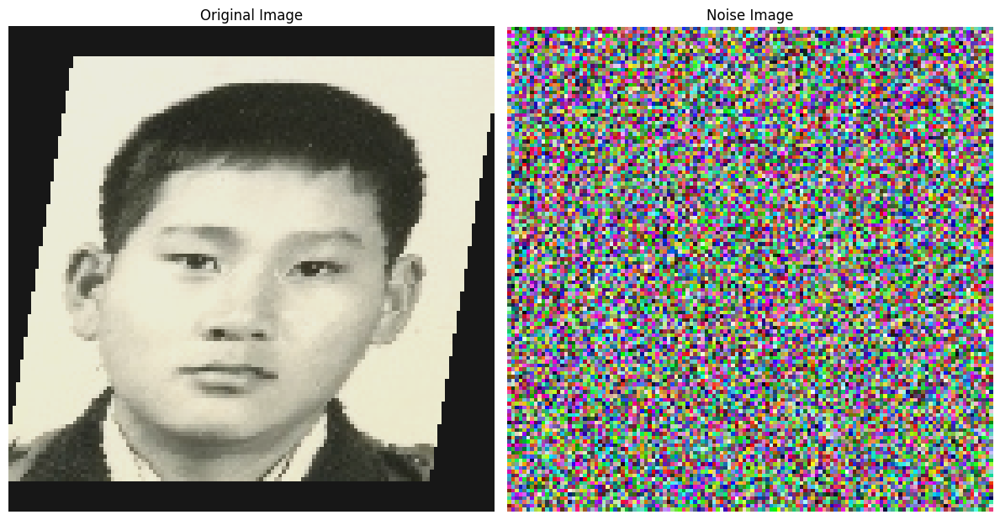

Epoch [1/2], Batch [22/134] - Batch Loss: 2.0055


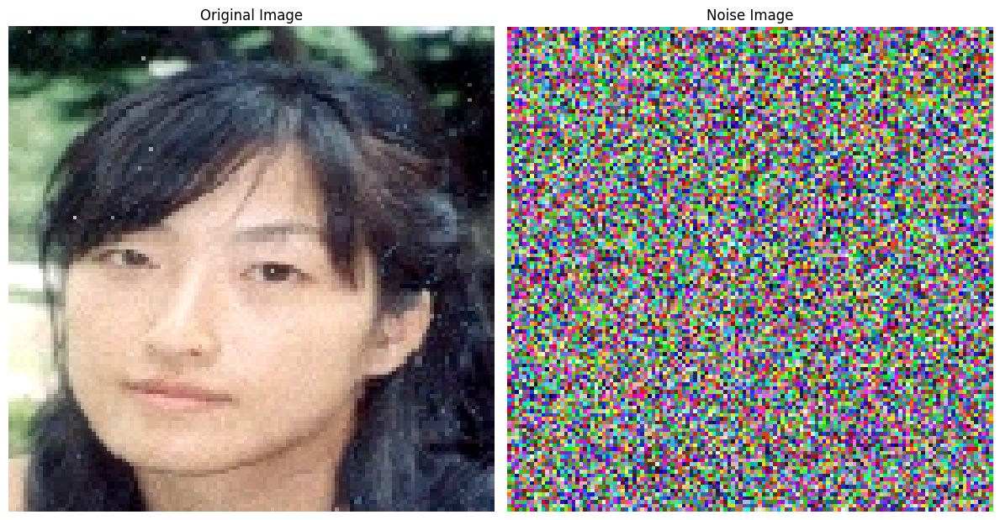

Epoch [1/2], Batch [23/134] - Batch Loss: 1.9393
Epoch [1/2] - Train Loss: 0.4714


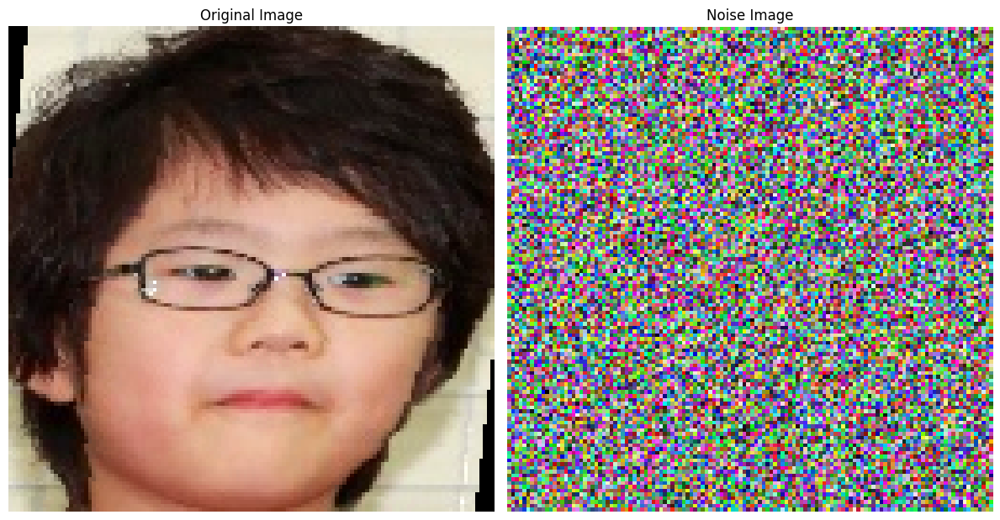

Epoch [2/2], Batch [1/134] - Batch Loss: 2.2429


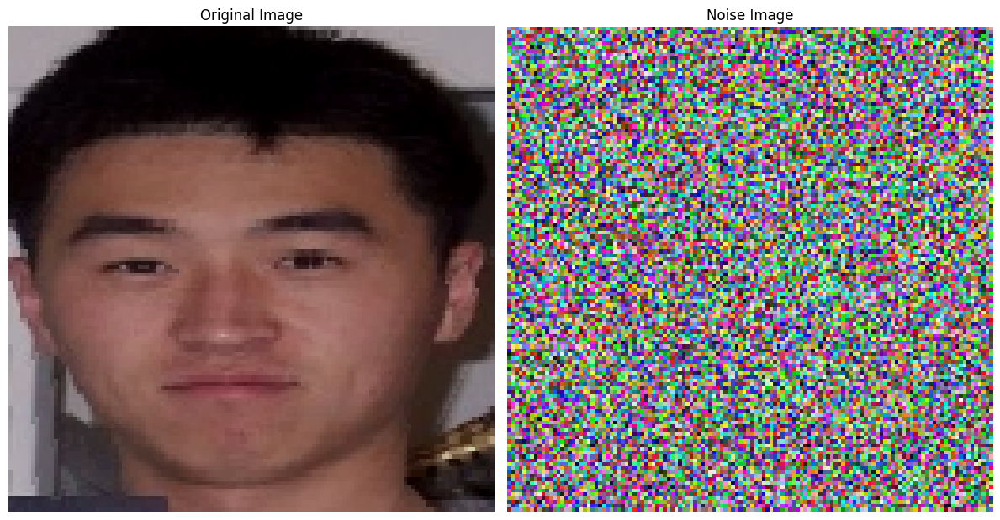

Epoch [2/2], Batch [2/134] - Batch Loss: 2.0557


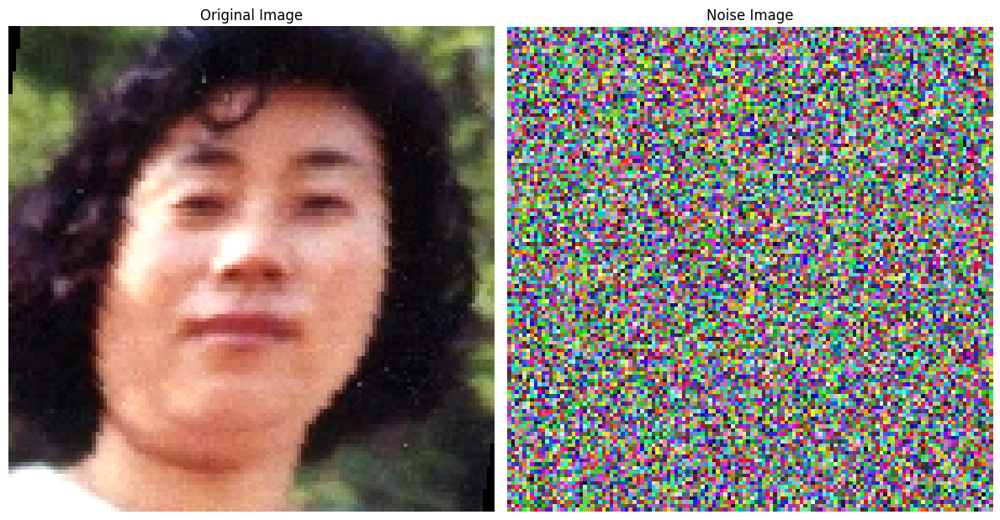

Epoch [2/2], Batch [3/134] - Batch Loss: 2.0700


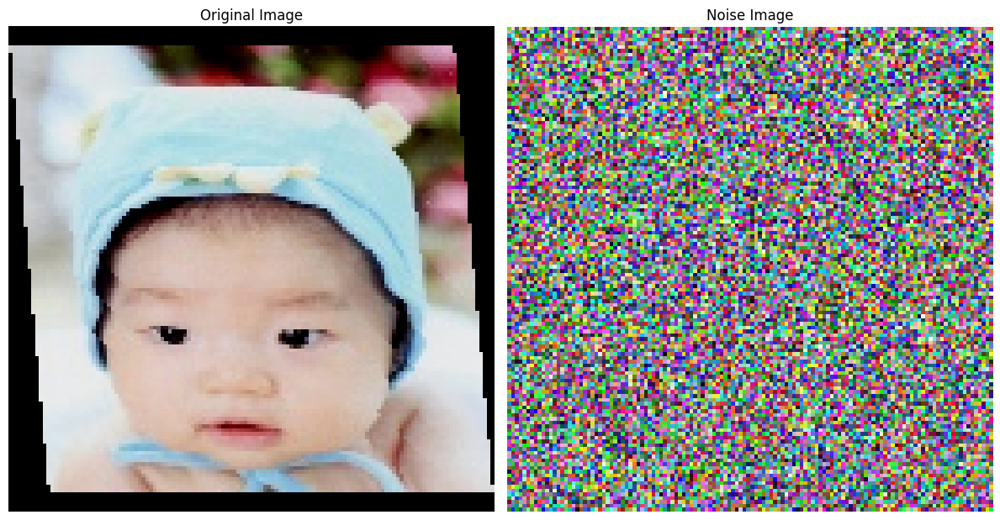

Epoch [2/2], Batch [4/134] - Batch Loss: 2.1157


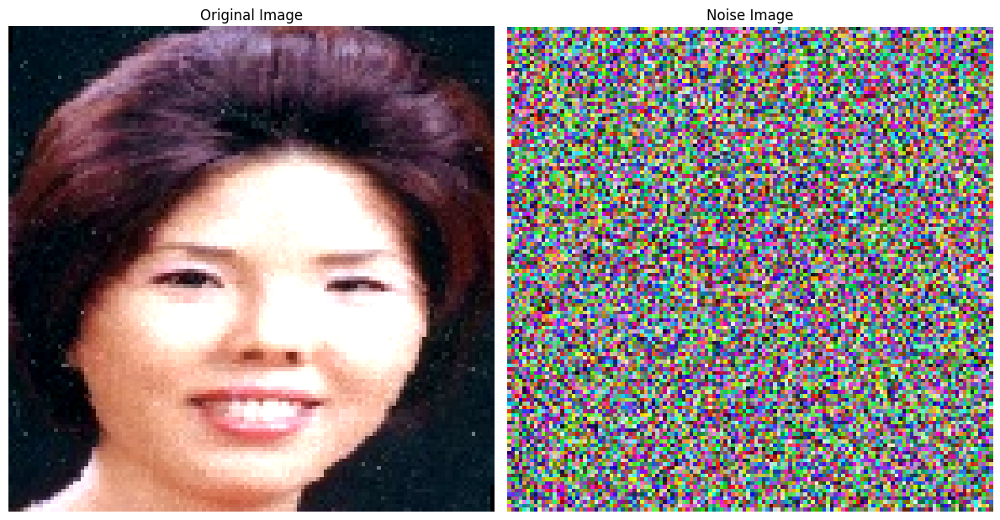

Epoch [2/2], Batch [5/134] - Batch Loss: 2.0169


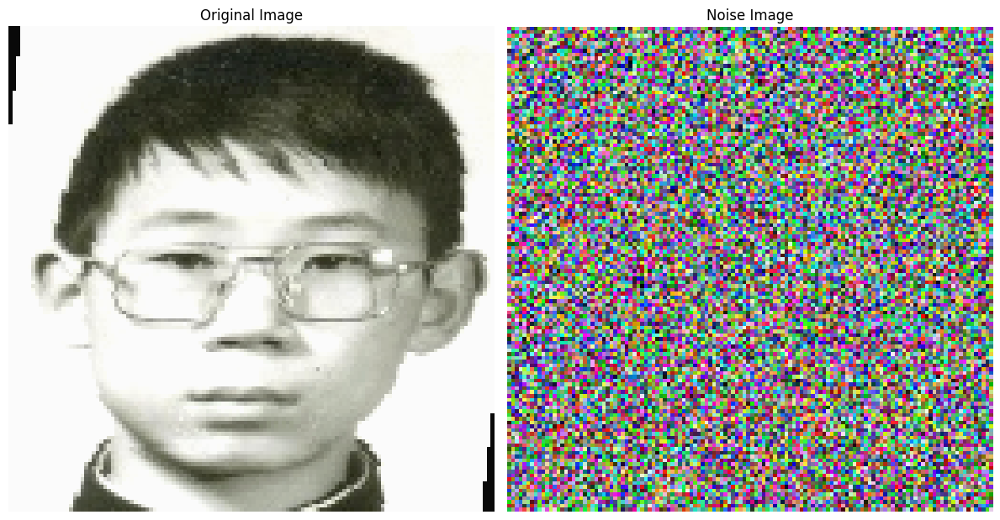

Epoch [2/2], Batch [6/134] - Batch Loss: 2.0532


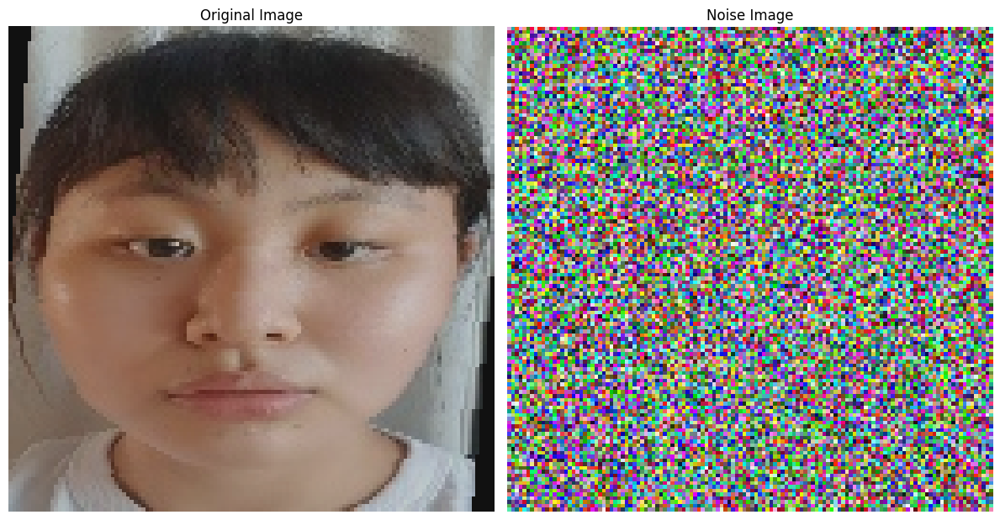

Epoch [2/2], Batch [7/134] - Batch Loss: 2.0629


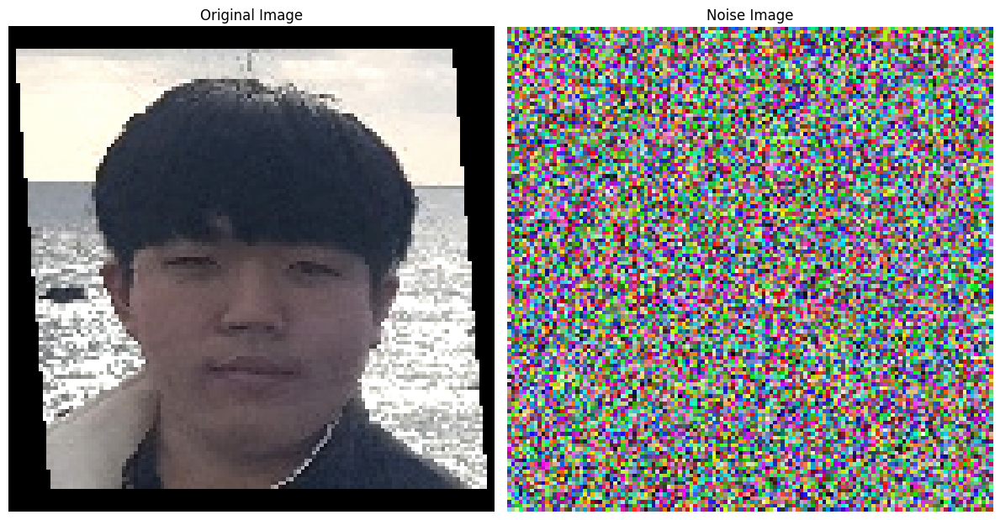

Epoch [2/2], Batch [8/134] - Batch Loss: 2.0387


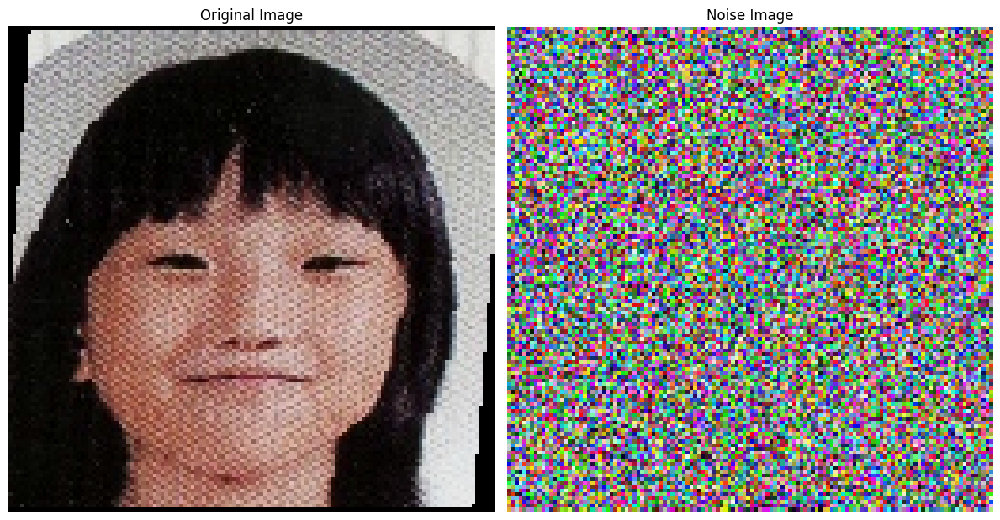

Epoch [2/2], Batch [9/134] - Batch Loss: 1.8953


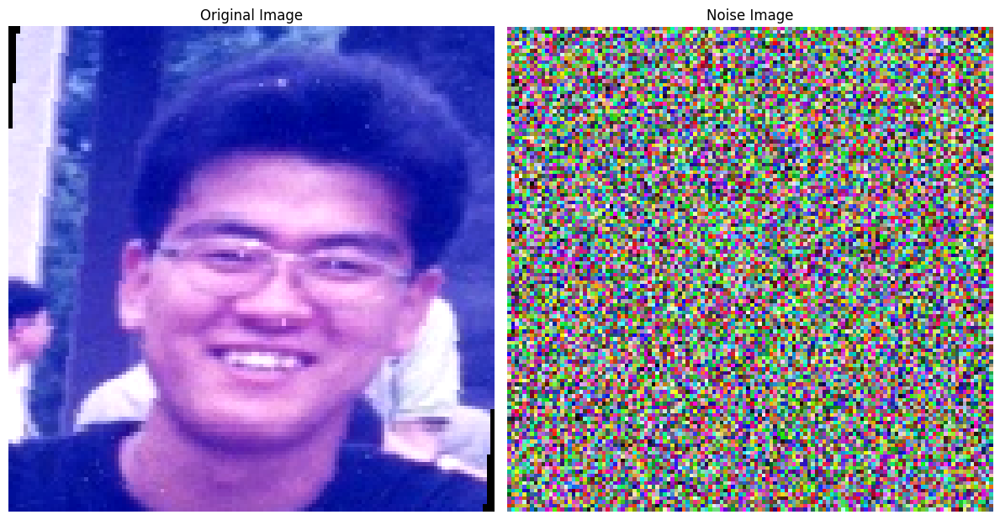

Epoch [2/2], Batch [10/134] - Batch Loss: 1.9179


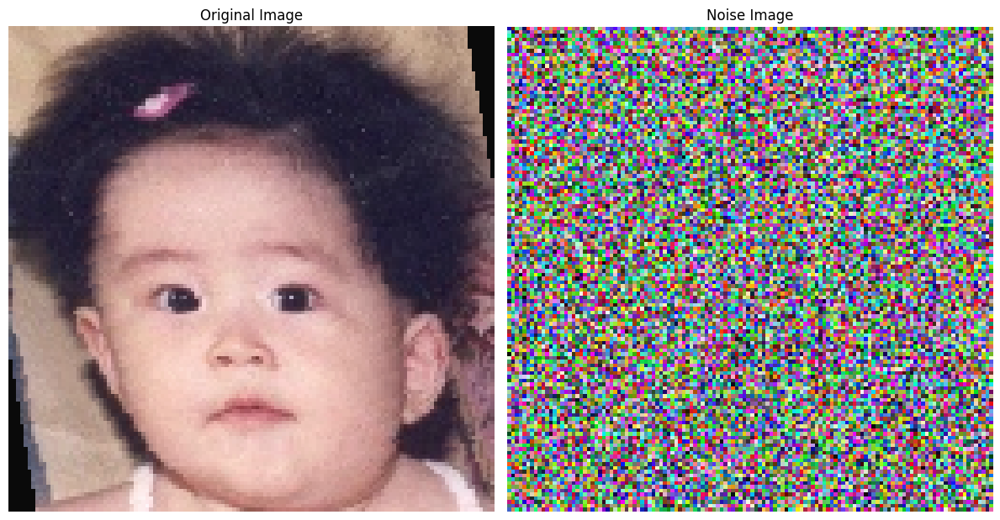

Epoch [2/2], Batch [11/134] - Batch Loss: 2.1361


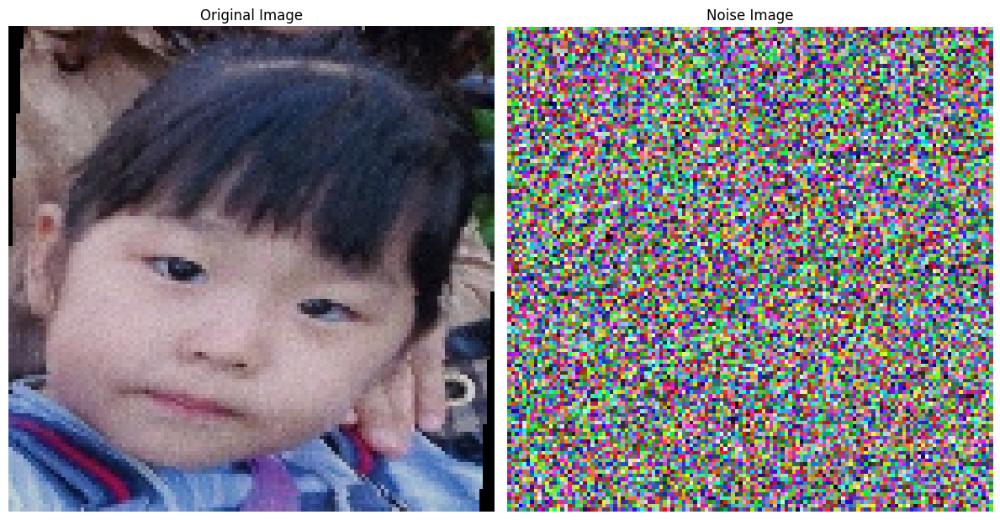

Epoch [2/2], Batch [12/134] - Batch Loss: 1.9072


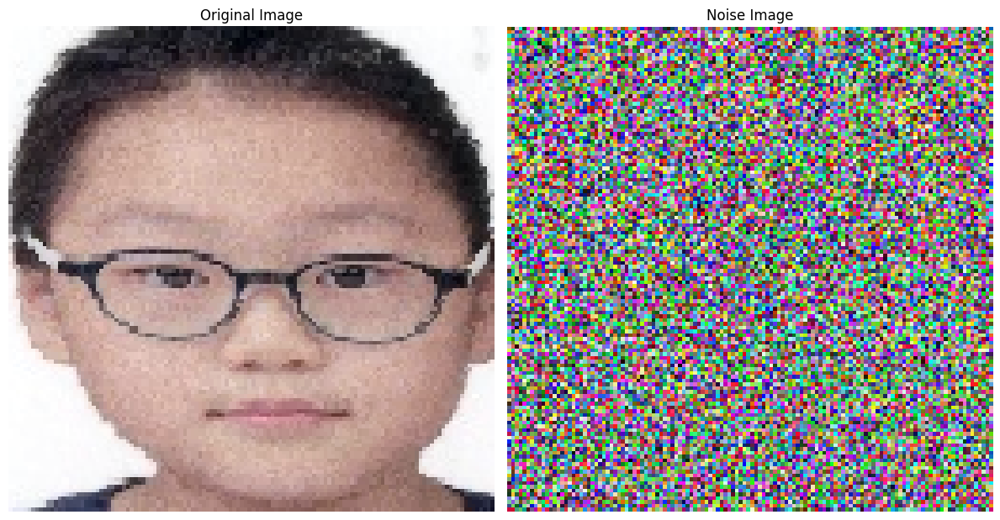

Epoch [2/2], Batch [13/134] - Batch Loss: 2.0689


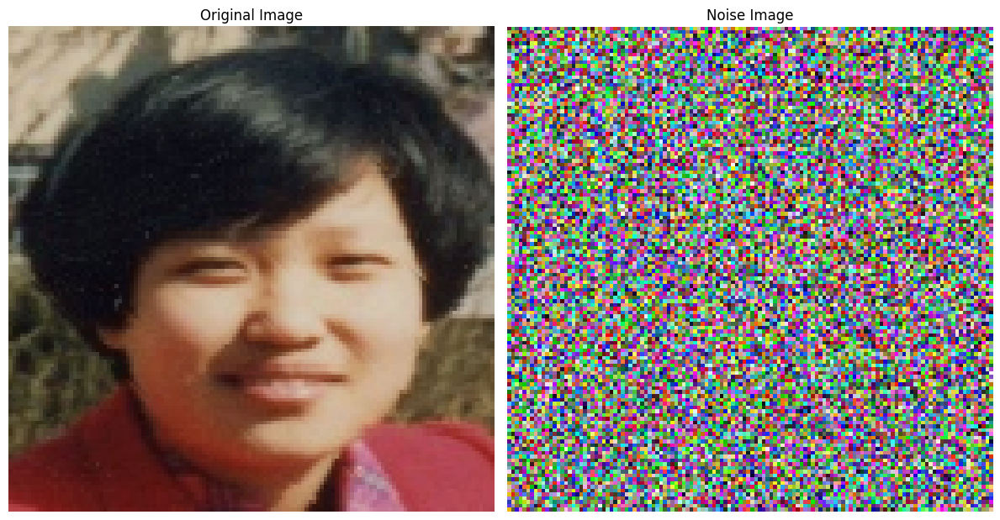

Epoch [2/2], Batch [14/134] - Batch Loss: 1.9480


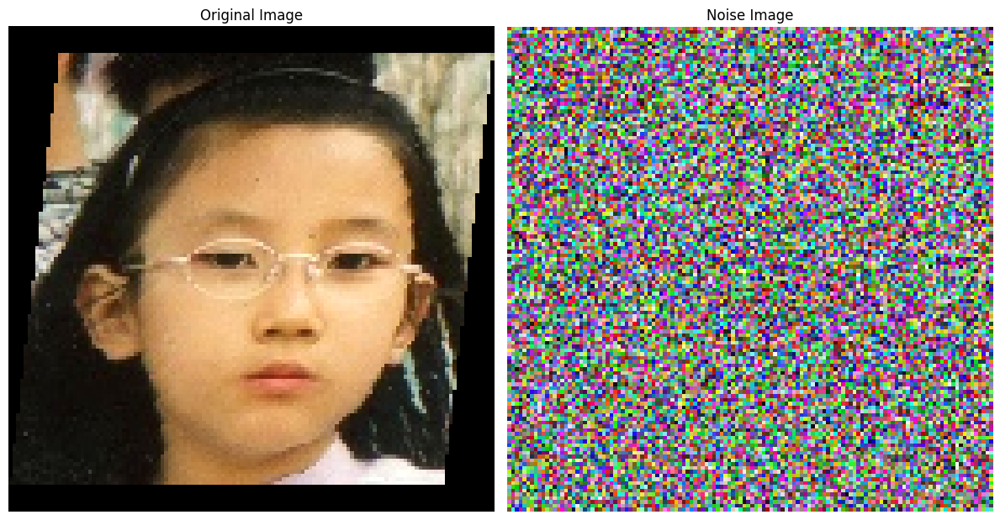

Epoch [2/2], Batch [15/134] - Batch Loss: 1.9641


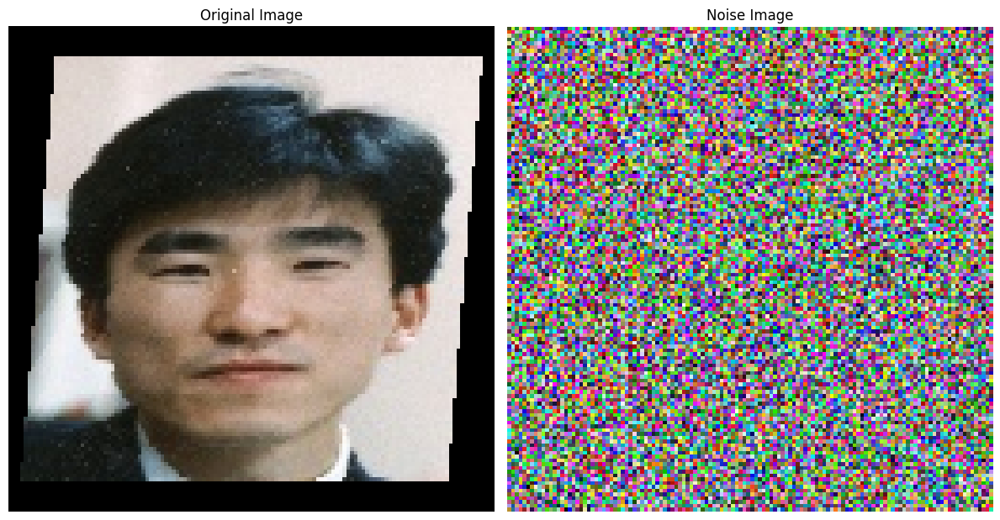

Epoch [2/2], Batch [16/134] - Batch Loss: 1.9773


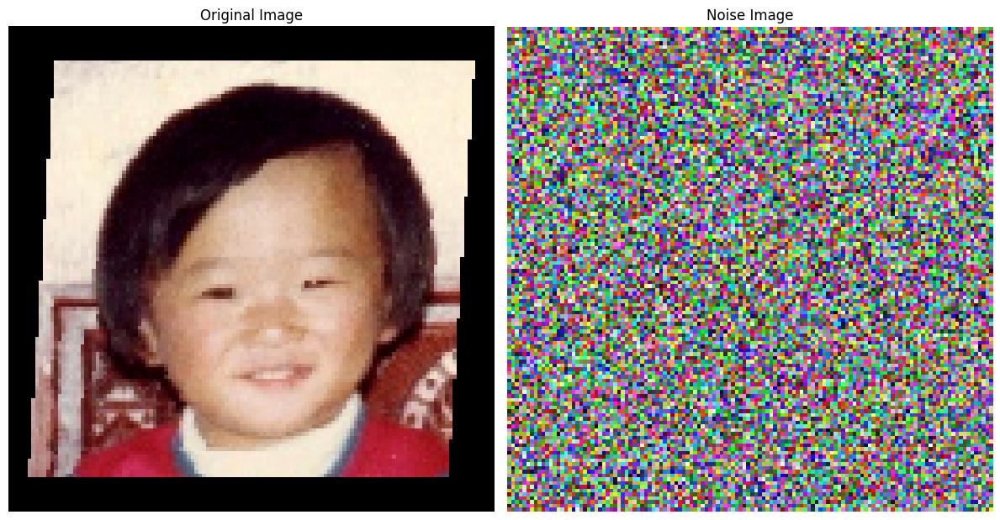

Epoch [2/2], Batch [17/134] - Batch Loss: 1.8227


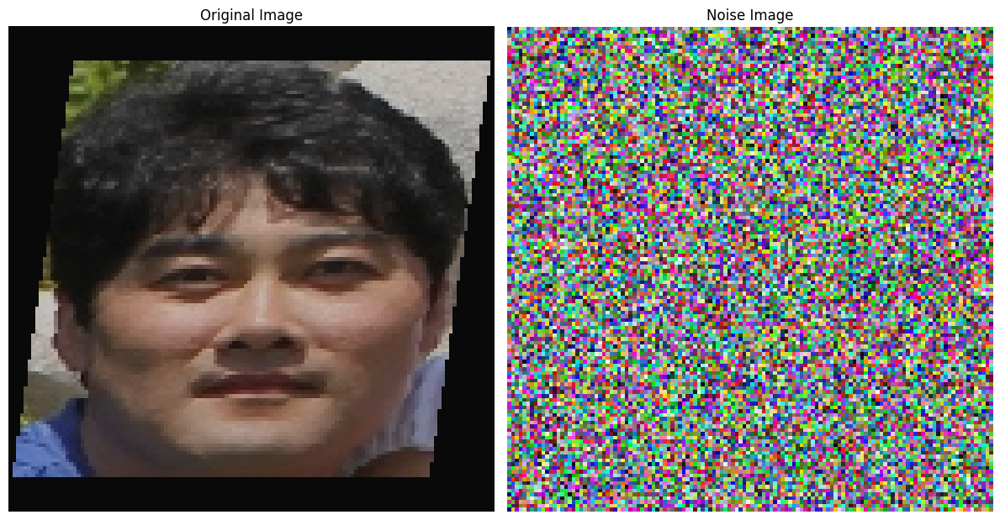

Epoch [2/2], Batch [18/134] - Batch Loss: 2.1474


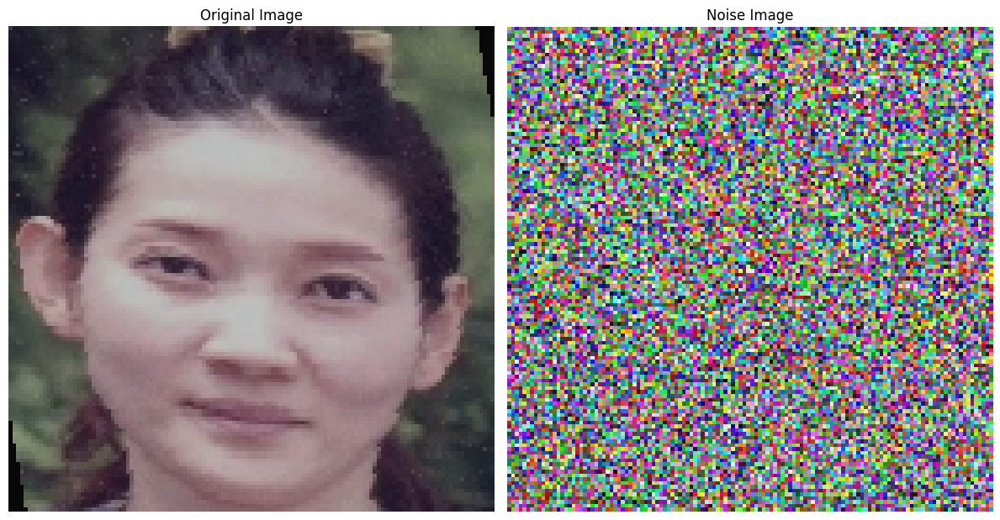

Epoch [2/2], Batch [19/134] - Batch Loss: 1.9716


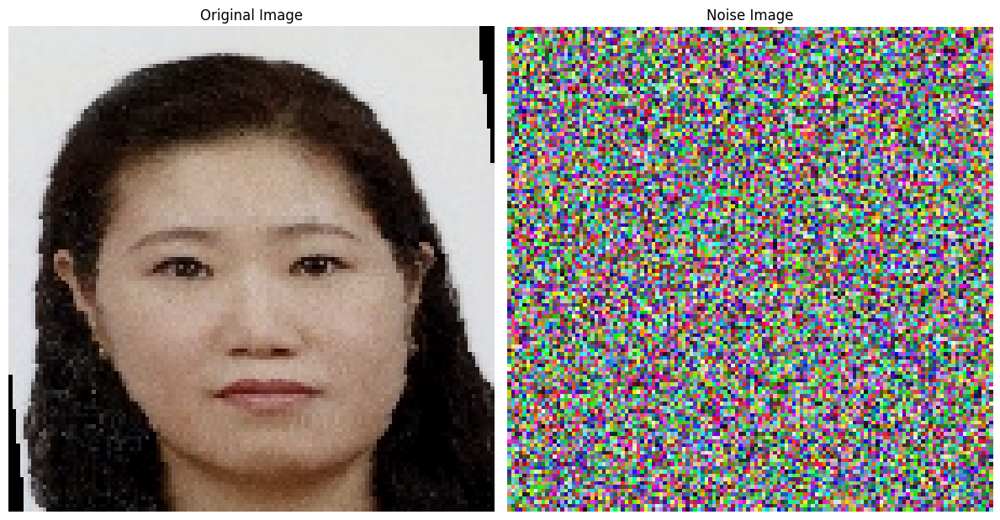

Epoch [2/2], Batch [20/134] - Batch Loss: 1.9823


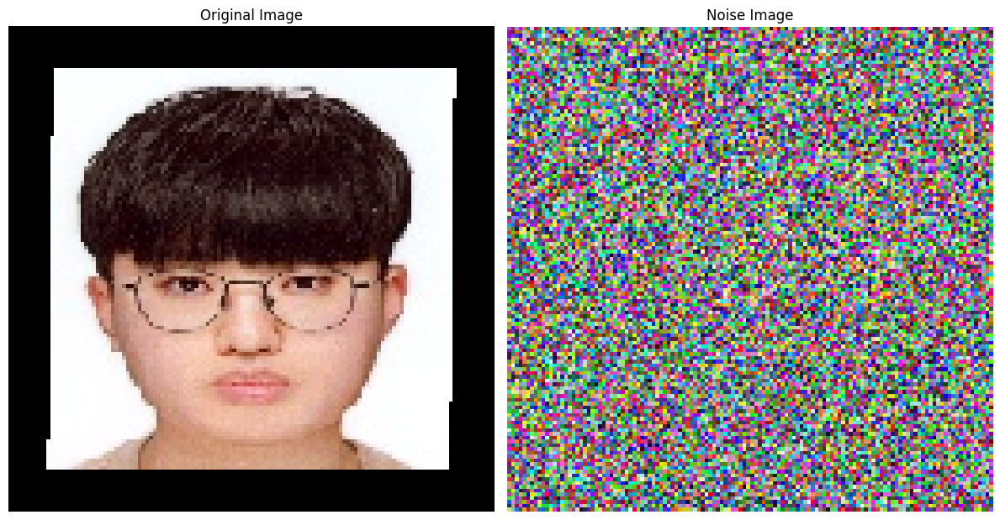

Epoch [2/2], Batch [21/134] - Batch Loss: 1.9547


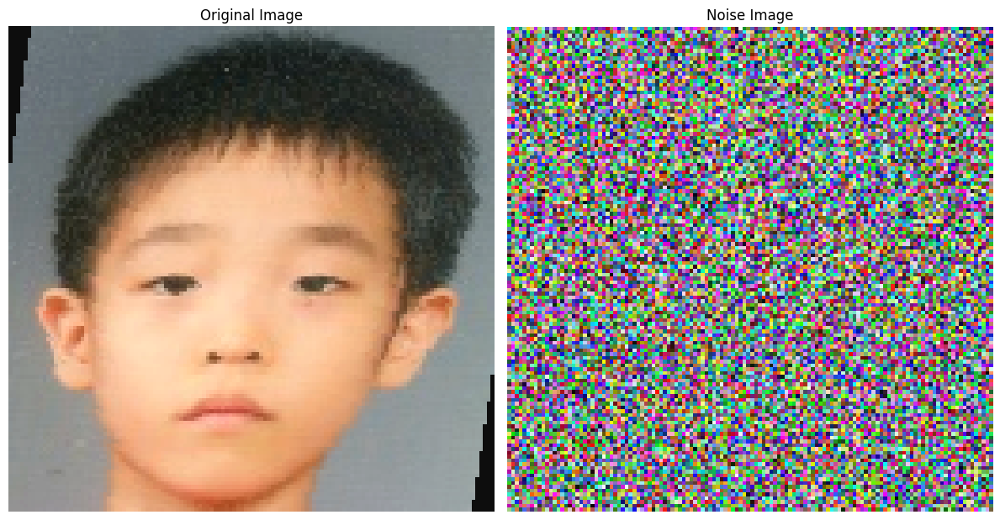

Epoch [2/2], Batch [22/134] - Batch Loss: 1.9355


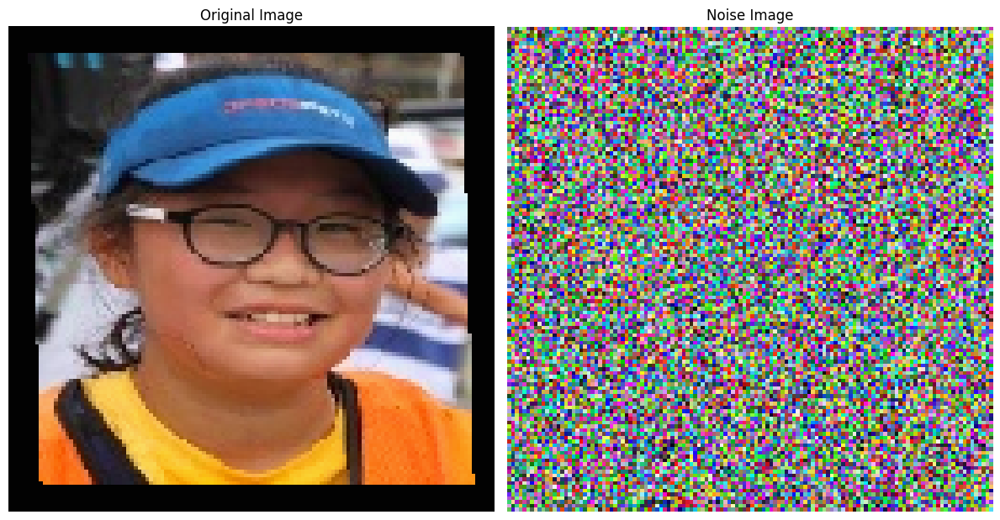

Epoch [2/2], Batch [23/134] - Batch Loss: 2.0780
Epoch [2/2] - Train Loss: 0.3460


In [42]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(unlearned_model.parameters(), lr=0.001)

print_interval = 1
train_epoch_losses = []

num_epochs = 2
for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, ((x_retain, y_retain), (x_forget, y_forget)) in enumerate(zip(retain_dataloader_train, forget_dataloader_train)):
        y_retain = y_retain.cuda()
        batch_size_forget = y_forget.size(0)

        if x_retain.size(0) != 64 or x_forget.size(0) != 64:
            continue

        # Initialize the noise.
        noise_dim = x_retain.size(1), x_retain.size(2), x_retain.size(3)
        noise = Noise(batch_size_forget, *noise_dim).cuda()
        noise_optimizer = torch.optim.Adam(noise.parameters(), lr=0.01)
        noise_tensor = noise()[:batch_size_forget]

        # Update the noise for increasing the loss value.
        for _ in range(5):
            outputs = unlearned_model(noise_tensor)
            with torch.no_grad():
                target_logits = unlearned_model(x_forget.cuda())
            # Maximize the similarity between noise data and forget features.
            loss_noise = -F.mse_loss(outputs, target_logits)

            # Backpropagate to update the noise.
            noise_optimizer.zero_grad()
            loss_noise.backward(retain_graph=True)
            noise_optimizer.step()

        # Train the model with noise and retain image
        noise_tensor = torch.clamp(noise_tensor, 0, 1).detach().cuda()
        outputs = unlearned_model(noise_tensor.cuda())
        loss_1 = criterion(outputs, y_retain)

        outputs = unlearned_model(x_retain.cuda())
        loss_2 = criterion(outputs, y_retain)

        joint_loss = loss_1 + loss_2

        optimizer.zero_grad()
        joint_loss.backward()
        optimizer.step()
        running_loss += joint_loss.item() * x_retain.size(0)

        original_image = x_retain[0].cpu().numpy().transpose(1, 2, 0)
        image1 = TF.to_pil_image(float_to_uint8(original_image))
        image2 = TF.to_pil_image(noise.noise[0].cpu())

        # Display original image.
        original_image = x_retain[0].cpu().numpy().transpose(1, 2, 0)
        plt.figure(figsize=(12, 8))
        plt.subplot(1, 2, 1)  # 2 rows, 2 columns, position 1
        plt.imshow(image1)
        plt.title("Original Image")
        plt.axis('off')

        # Display first noise image.
        plt.subplot(1, 2, 2)
        plt.imshow(image2)
        plt.title("Noise Image")
        plt.axis('off')

        # Show all the subplots.
        plt.tight_layout()
        plt.show()

        if batch_idx % print_interval == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {joint_loss.item():.4f}")

    average_train_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    train_epoch_losses.append(average_train_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}] - Train Loss: {average_train_loss:.4f}")

In [43]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())
print()
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')

[Test]
[Batch: 1] running test loss: 0.0211911890655756, running test accuracy: 0.59375, running top-2 accuracy: 0.921875
test loss: 0.024686942323606614, accuracy: 0.5834957764782326, top-2 accuracy: 0.8700454840805718
elapsed time: 1.0294976234436035
[Test]
[Batch: 1] running test loss: 0.01822846382856369, running test accuracy: 0.65625, running top-2 accuracy: 0.96875
test loss: 0.020429355270685033, accuracy: 0.6363031914893617, top-2 accuracy: 0.8876329787234043
elapsed time: 1.003955364227295

Test Acc: {'Loss': 0.024686942323606614, 'Acc': 0.5834957764782326, 'Top-2 Acc': 0.8700454840805718}
Unseen Acc: {'Loss': 0.020429355270685033, 'Acc': 0.6363031914893617, 'Top-2 Acc': 0.8876329787234043}
MIA: {'MIA': 0.7179401993355481, 'Forgeting Score': 0.2179401993355481}
Final Score: 0.5738076889035681


<b>Stage 2: Repair</b>

In [44]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(unlearned_model.parameters(), lr=0.001)

num_epochs = 1
for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, (x_retain, y_retain) in enumerate(retain_dataloader_train):
        y_retain = y_retain.cuda()

        # Classification Loss
        outputs_retain = unlearned_model(x_retain.cuda())
        classification_loss = criterion(outputs_retain, y_retain)

        optimizer.zero_grad()
        classification_loss.backward()
        optimizer.step()

        running_loss += classification_loss.item() * x_retain.size(0)
        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {classification_loss.item():.4f}")

    average_epoch_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    print(f"Epoch [{epoch+1}/{num_epochs}] - Total Loss: {running_loss:.4f}")

Epoch [1/1], Batch [1/134] - Batch Loss: 0.0891
Epoch [1/1], Batch [2/134] - Batch Loss: 0.0656
Epoch [1/1], Batch [3/134] - Batch Loss: 0.1886
Epoch [1/1], Batch [4/134] - Batch Loss: 0.1197
Epoch [1/1], Batch [5/134] - Batch Loss: 0.1603
Epoch [1/1], Batch [6/134] - Batch Loss: 0.0824
Epoch [1/1], Batch [7/134] - Batch Loss: 0.1832
Epoch [1/1], Batch [8/134] - Batch Loss: 0.1506
Epoch [1/1], Batch [9/134] - Batch Loss: 0.1810
Epoch [1/1], Batch [10/134] - Batch Loss: 0.0749
Epoch [1/1], Batch [11/134] - Batch Loss: 0.1752
Epoch [1/1], Batch [12/134] - Batch Loss: 0.2100
Epoch [1/1], Batch [13/134] - Batch Loss: 0.0495
Epoch [1/1], Batch [14/134] - Batch Loss: 0.1891
Epoch [1/1], Batch [15/134] - Batch Loss: 0.0948
Epoch [1/1], Batch [16/134] - Batch Loss: 0.1582
Epoch [1/1], Batch [17/134] - Batch Loss: 0.1286
Epoch [1/1], Batch [18/134] - Batch Loss: 0.0671
Epoch [1/1], Batch [19/134] - Batch Loss: 0.1240
Epoch [1/1], Batch [20/134] - Batch Loss: 0.0851
Epoch [1/1], Batch [21/134] -

In [45]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())
print()
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')

[Test]
[Batch: 1] running test loss: 0.022729696705937386, running test accuracy: 0.640625, running top-2 accuracy: 0.90625
test loss: 0.02683080574999853, accuracy: 0.5925925925925926, top-2 accuracy: 0.8641975308641975
elapsed time: 1.0384621620178223
[Test]
[Batch: 1] running test loss: 0.017560824751853943, running test accuracy: 0.71875, running top-2 accuracy: 0.96875
test loss: 0.021959169629089375, accuracy: 0.6363031914893617, top-2 accuracy: 0.8696808510638298
elapsed time: 0.9977707862854004

Test Acc: {'Loss': 0.02683080574999853, 'Acc': 0.5925925925925926, 'Top-2 Acc': 0.8641975308641975}
Unseen Acc: {'Loss': 0.021959169629089375, 'Acc': 0.6363031914893617, 'Top-2 Acc': 0.8696808510638298}
MIA: {'MIA': 0.706312292358804, 'Forgeting Score': 0.206312292358804}
Final Score: 0.5899840039374923


#### <b>Scrub</b>

In [46]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
original_model = models.resnet18(pretrained=False)
num_features = original_model.fc.in_features
original_model.fc = nn.Linear(num_features, 8)
original_model.load_state_dict(torch.load(original_save_path))
original_model = original_model.cuda()
criterion = nn.CrossEntropyLoss()

In [47]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
scrub_model = models.resnet18(pretrained=False)
num_features = scrub_model.fc.in_features
scrub_model.fc = nn.Linear(num_features, 8)
scrub_model.load_state_dict(torch.load(original_save_path))
scrub_model = scrub_model.cuda()
criterion = nn.CrossEntropyLoss()

In [48]:
class DistillKL(nn.Module):
    def __init__(self, T):
        super(DistillKL, self).__init__()
        self.T = T

    def forward(self, y_s, y_t):
        p_s = F.log_softmax(y_s/self.T, dim=1)
        p_t = F.softmax(y_t/self.T, dim=1)
        loss = F.kl_div(p_s, p_t, size_average=False) * (self.T**2) / y_s.shape[0]
        return loss

In [49]:
class SCRUBTraining:
    def __init__(self, teacher, student, retain_dataloader, forget_dataloader):
        self.teacher = teacher
        self.student = student
        self.retain_dataloader = retain_dataloader
        self.forget_dataloader = forget_dataloader

        self.criterion_cls = nn.CrossEntropyLoss()
        self.criterion_div = DistillKL(4.0)
        self.criterion_kd = DistillKL(4.0)

        self.optimizer = optim.SGD(student.parameters(), lr=0.001)

    def train_epoch(self):
        self.student.train()
        self.teacher.eval()

        # Function to compute accuracy.
        def compute_accuracy(outputs, labels):
            _, predicted = outputs.max(1)
            total = labels.size(0)
            correct = predicted.eq(labels).sum().item()
            return 100 * correct / total

        total_loss_retain, total_accuracy_retain = 0, 0
        total_loss_forget, total_accuracy_forget = 0, 0

        # Training with retain data.
        for inputs_retain, labels_retain in self.retain_dataloader:
            inputs_retain, labels_retain = inputs_retain.cuda(), labels_retain.cuda()

            # Forward pass: Student
            outputs_retain_student = self.student(inputs_retain)

            # Forward pass: Teacher
            with torch.no_grad():
                outputs_retain_teacher = self.teacher(inputs_retain)

            # Loss computation
            loss_cls = self.criterion_cls(outputs_retain_student, labels_retain)
            loss_div_retain = self.criterion_div(outputs_retain_student, outputs_retain_teacher)

            loss = loss_cls + loss_div_retain

            # Update total loss and accuracy for retain data.
            total_loss_retain += loss.item()
            total_accuracy_retain += compute_accuracy(outputs_retain_student, labels_retain)

            # Backward pass
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()

        # Training with forget data.
        for inputs_forget, labels_forget in self.forget_dataloader:
            inputs_forget, labels_forget = inputs_forget.cuda(), labels_forget.cuda()

            # Forward pass: Student
            outputs_forget_student = self.student(inputs_forget)

            # Forward pass: Teacher
            with torch.no_grad():
                outputs_forget_teacher = self.teacher(inputs_forget)

            # We want to maximize the divergence for the forget data.
            loss_div_forget = -self.criterion_div(outputs_forget_student, outputs_forget_teacher)

            # Update total loss and accuracy for forget data.
            total_loss_forget += loss_div_forget.item()
            total_accuracy_forget += compute_accuracy(outputs_forget_student, labels_forget)

            # Backward pass
            self.optimizer.zero_grad()
            loss_div_forget.backward()
            self.optimizer.step()

        # Print average loss and accuracy for the entire epoch
        avg_loss_retain = total_loss_retain / len(self.retain_dataloader)
        avg_accuracy_retain = total_accuracy_retain / len(self.retain_dataloader)

        avg_loss_forget = total_loss_forget / len(self.forget_dataloader)
        avg_accuracy_forget = total_accuracy_forget / len(self.forget_dataloader)

        print(f'Epoch Retain: Avg Loss: {avg_loss_retain:.4f}, Avg Accuracy: {avg_accuracy_retain:.2f}%')
        print(f'Epoch Forget: Avg Loss: {avg_loss_forget:.4f}, Avg Accuracy: {avg_accuracy_forget:.2f}%')

In [50]:
teacher = original_model
student = scrub_model

# Initialize and train
scrub_trainer = SCRUBTraining(teacher, student, retain_dataloader_train, forget_dataloader_train)

num_epochs = 2
for epoch in range(num_epochs):
    scrub_trainer.train_epoch()
    print(f"Epoch {epoch+1} completed.")

Epoch Retain: Avg Loss: 0.3590, Avg Accuracy: 96.22%
Epoch Forget: Avg Loss: -0.6563, Avg Accuracy: 95.00%
Epoch 1 completed.
Epoch Retain: Avg Loss: 0.3920, Avg Accuracy: 95.90%
Epoch Forget: Avg Loss: -0.7443, Avg Accuracy: 93.11%
Epoch 2 completed.


In [51]:
# Performance
test_acc = evaluation(scrub_model, test_dataloader)
unseen_acc = evaluation(scrub_model, unseen_dataloader)
mia = cal_mia(scrub_model.cuda())
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')

[Test]
[Batch: 1] running test loss: 0.02591647207736969, running test accuracy: 0.6875, running top-2 accuracy: 0.90625
test loss: 0.033175351869138205, accuracy: 0.589993502274204, top-2 accuracy: 0.8706952566601689
elapsed time: 1.0261571407318115
[Test]
[Batch: 1] running test loss: 0.02561810426414013, running test accuracy: 0.640625, running top-2 accuracy: 0.90625
test loss: 0.025870089201217004, accuracy: 0.6476063829787234, top-2 accuracy: 0.8876329787234043
elapsed time: 1.0010650157928467
Test Acc: {'Loss': 0.033175351869138205, 'Acc': 0.589993502274204, 'Top-2 Acc': 0.8706952566601689}
Unseen Acc: {'Loss': 0.025870089201217004, 'Acc': 0.6476063829787234, 'Top-2 Acc': 0.8876329787234043}
MIA: {'MIA': 0.6295681063122924, 'Forgeting Score': 0.12956810631229243}
Final Score: 0.6654286448248096
